In [1]:
import pandas as pd
import os
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
import warnings
from joblib import dump
import matplotlib.pyplot as plt
import numpy as np

warnings.filterwarnings("ignore")

In [2]:
df = pd.read_csv("cleaned_data.csv")
df.shape

(1579732, 15)

In [3]:
df["date"] = pd.to_datetime(df["date"])
df["year"] = df["date"].dt.year
df["month"] = df["date"].dt.month
df["day"] = df["date"].dt.day
df["hour"] = pd.to_datetime(df["time"]).dt.hour
df["minute"] = df["date"].dt.minute
df["day_of_week"] = df["date"].dt.dayofweek

In [4]:
df_for_cov = df[
    [
        "temp",
        "feels_like",
        "wind_speed",
        "humidity",
        "available_bikes",
        "available_bike_stands",
        "year",
        "month",
        "day",
        "hour",
        "minute",
        "day_of_week",
    ]
]
covariance_matrix = df_for_cov.cov()
covariance_matrix

,temp,feels_like,wind_speed,humidity,available_bikes,available_bike_stands,year,month,day,hour,minute,day_of_week
temp,9.027965,11.836465,0.929274,-7.062577,-0.541063,0.428493,0.0,0.418648,1.894428,4.861348,0.0,-1.359855
feels_like,11.836465,16.503668,-0.253509,-6.137234,-0.702582,0.542570,0.0,0.594759,2.840263,6.370556,0.0,-1.880159
wind_speed,0.929274,-0.253509,3.450531,-3.483297,-0.091382,0.089966,0.0,-0.081016,-0.692410,0.526346,0.0,-0.021160
humidity,-7.062577,-6.137234,-3.483297,83.855804,0.591886,-0.574982,0.0,0.666269,-15.742003,-12.249298,0.0,0.733535
available_bikes,-0.541063,-0.702582,-0.091382,0.591886,98.742027,-84.037834,0.0,-0.017999,0.065647,-0.393454,0.0,0.200055
available_bike_stands,0.428493,0.542570,0.089966,-0.574982,-84.037834,125.623692,0.0,-0.000668,0.150064,0.251501,0.0,-0.246658
year,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000
month,0.418648,0.594759,-0.081016,0.666269,-0.017999,-0.000668,0.0,0.331865,-3.946941,-0.157145,0.0,0.003305
day,1.894428,2.840263,-0.692410,-15.742003,0.065647,0.150064,0.0,-3.946941,97.440296,3.265037,0.0,-2.124458
hour,4.861348,6.370556,0.526346,-12.249298,-0.393454,0.251501,0.0,-0.157145,3.265037,44.730579,0.0,-0.438998


Number of predictions for station 1: 2875
R^2 Score: 0.9615218662630691
Accuracy: 0.448


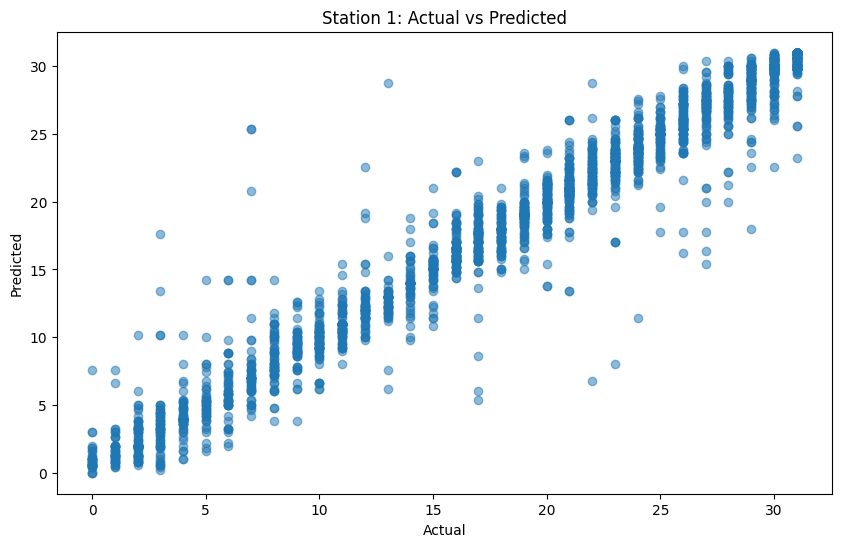

--------------------------------------------------
Number of predictions for station 2: 2619
R^2 Score: 0.9270210021817749
Accuracy: 0.5929744177166858


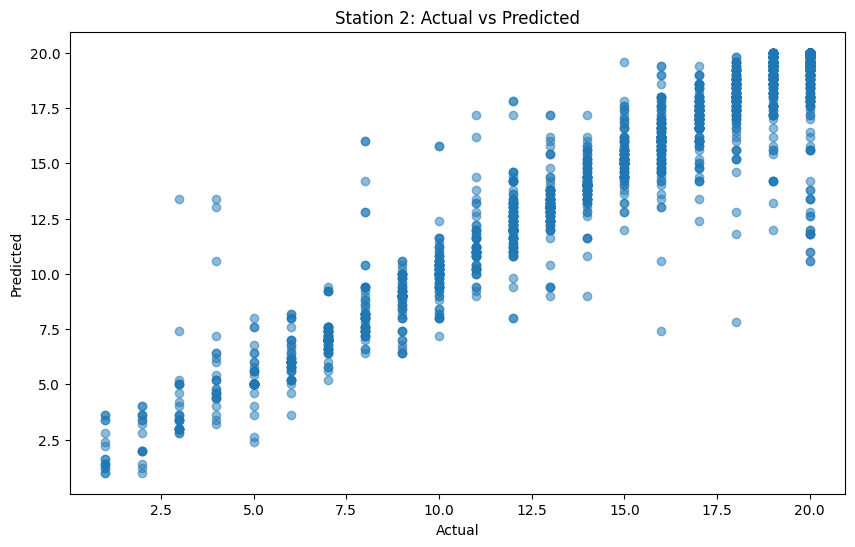

--------------------------------------------------
Number of predictions for station 3: 2796
R^2 Score: 0.9673891660188935
Accuracy: 0.530758226037196


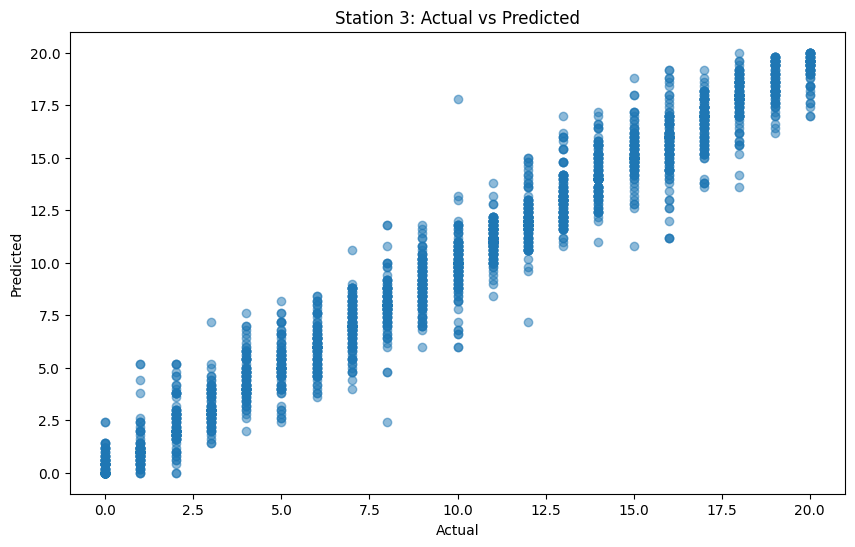

--------------------------------------------------
Number of predictions for station 4: 2660
R^2 Score: 0.9542378012684235
Accuracy: 0.6293233082706767


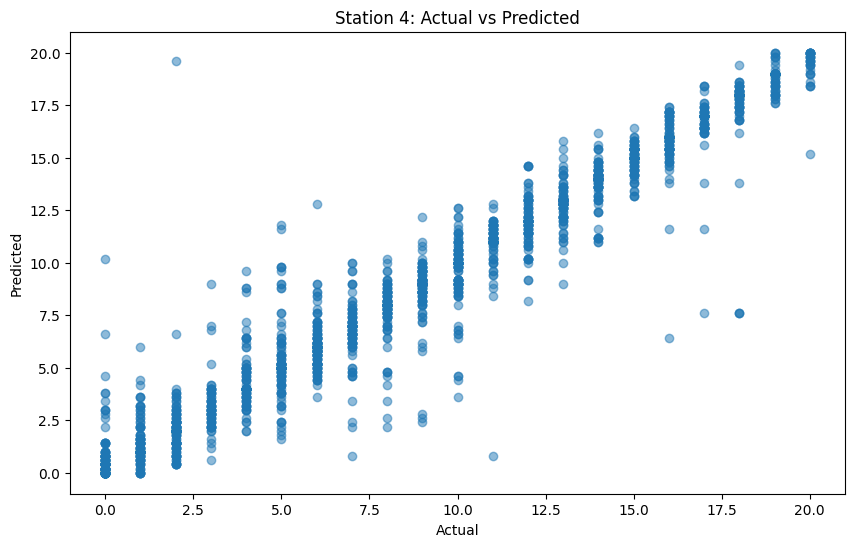

--------------------------------------------------
Number of predictions for station 5: 3175
R^2 Score: 0.9486705581806042
Accuracy: 0.4009448818897638


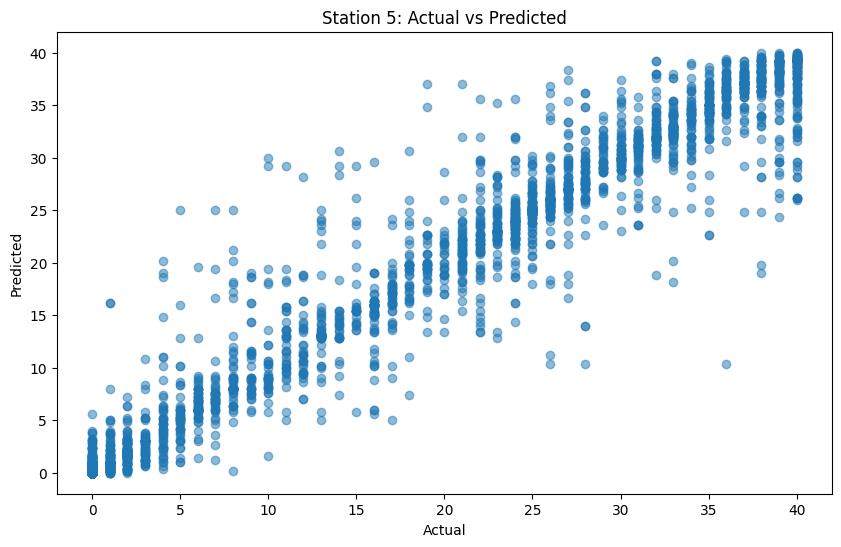

--------------------------------------------------
Number of predictions for station 6: 2707
R^2 Score: 0.9644865896766512
Accuracy: 0.5478389360916144


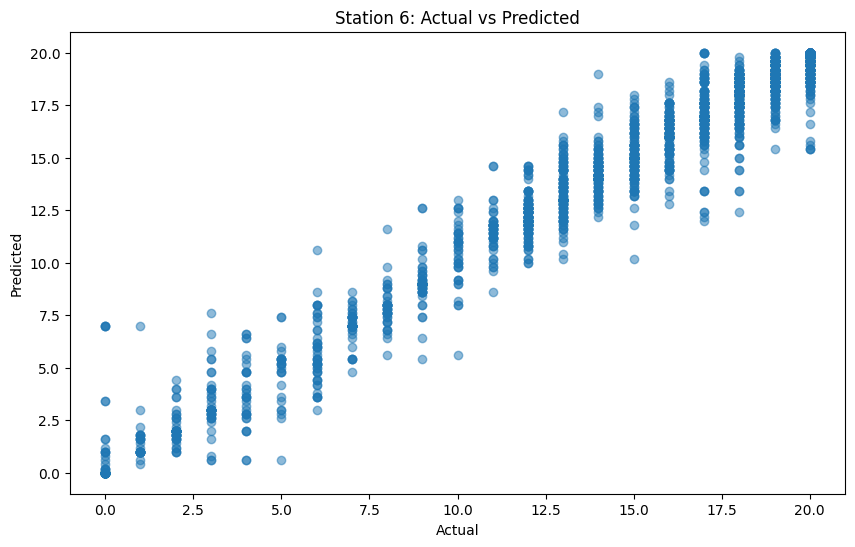

--------------------------------------------------
Number of predictions for station 7: 2614
R^2 Score: 0.9569149582779591
Accuracy: 0.6228003060443764


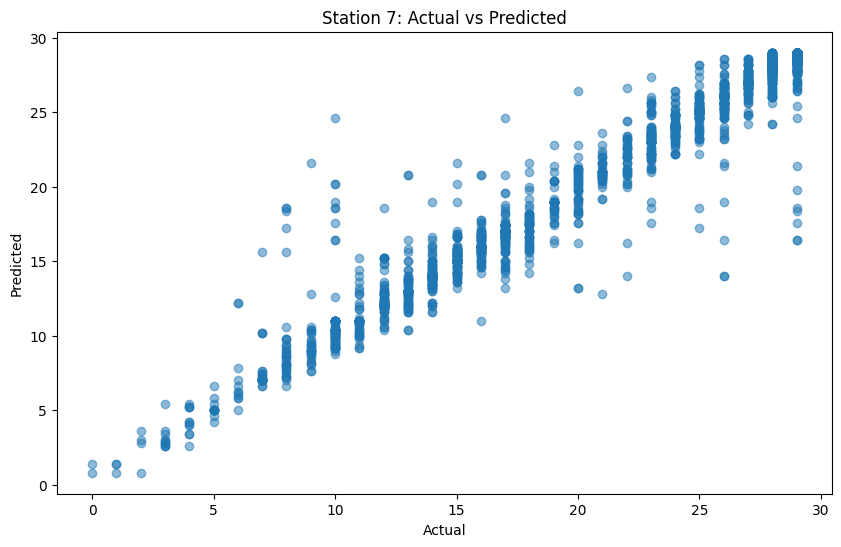

--------------------------------------------------
Number of predictions for station 8: 3010
R^2 Score: 0.926424084305306
Accuracy: 0.43023255813953487


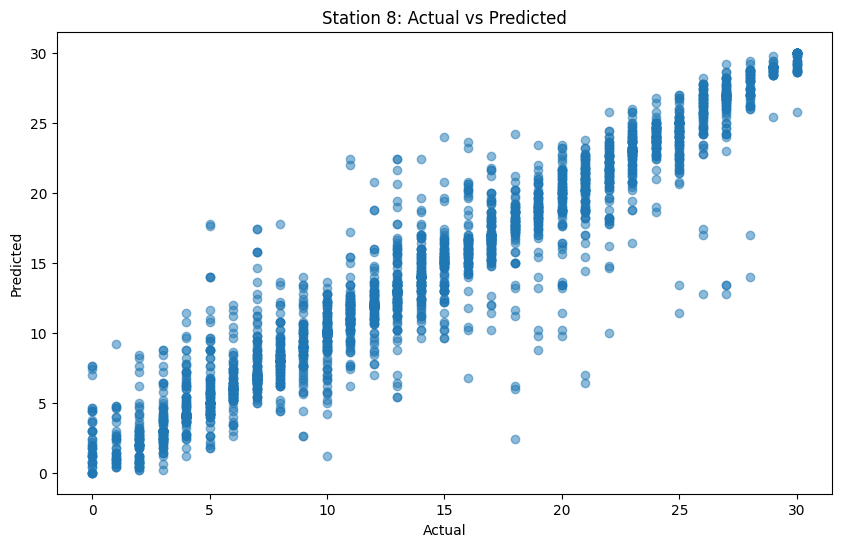

--------------------------------------------------
Number of predictions for station 9: 3137
R^2 Score: 0.9136907154742864
Accuracy: 0.38316863245138666


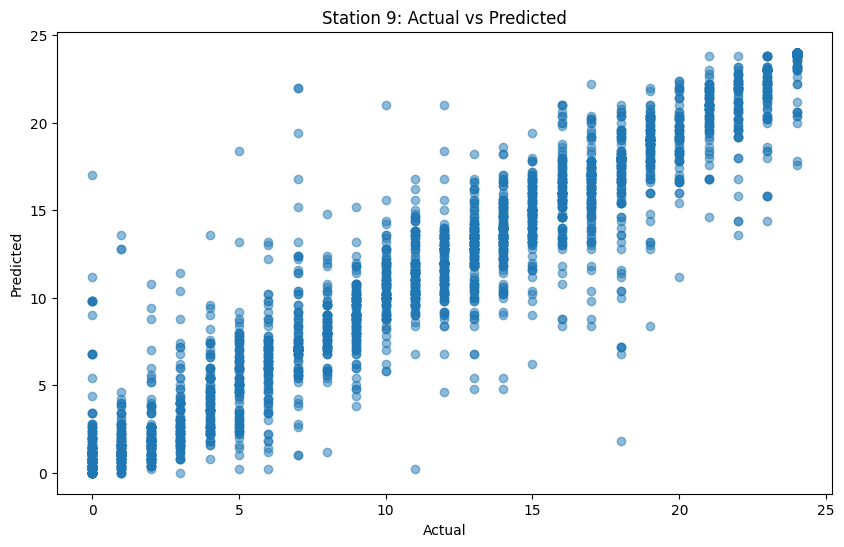

--------------------------------------------------
Number of predictions for station 10: 2885
R^2 Score: 0.9003057935393595
Accuracy: 0.5358752166377816


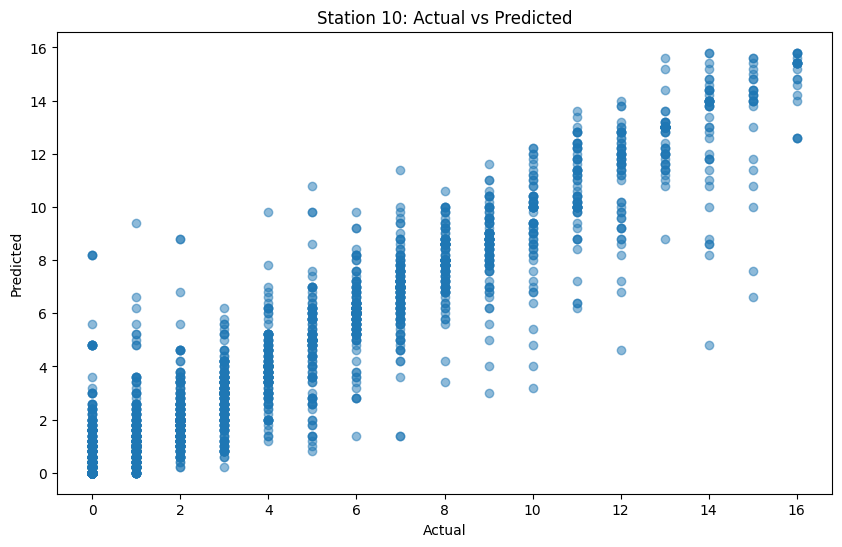

--------------------------------------------------
Number of predictions for station 11: 2554
R^2 Score: 0.9762242627945186
Accuracy: 0.658966327329679


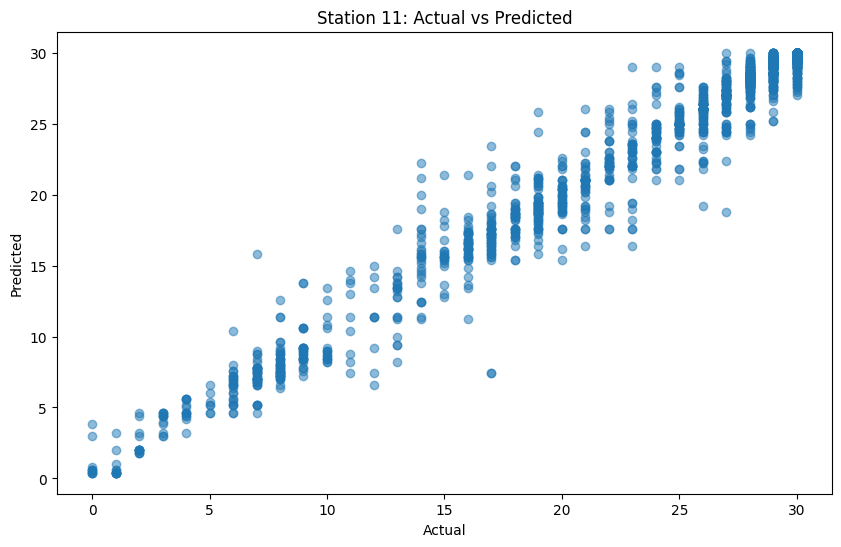

--------------------------------------------------
Number of predictions for station 12: 2591
R^2 Score: 0.9574878944402132
Accuracy: 0.6213817059050559


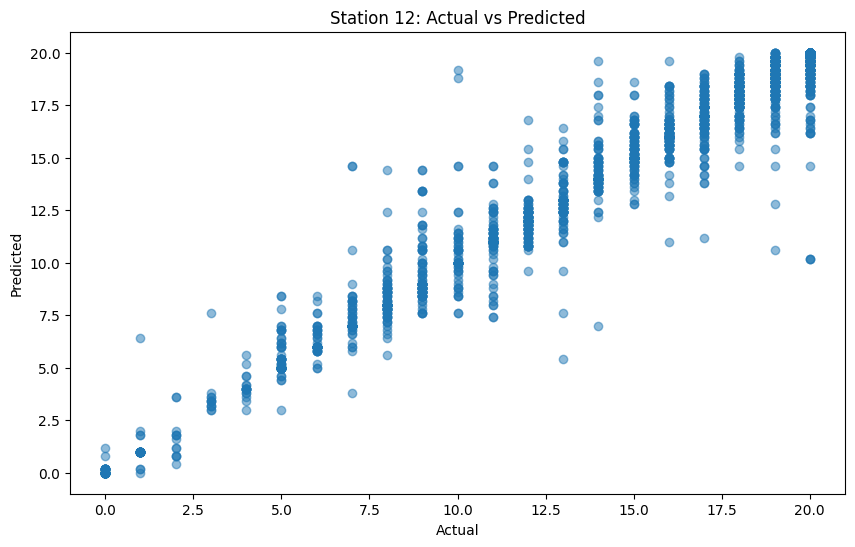

--------------------------------------------------
Number of predictions for station 13: 2560
R^2 Score: 0.959165962019134
Accuracy: 0.681640625


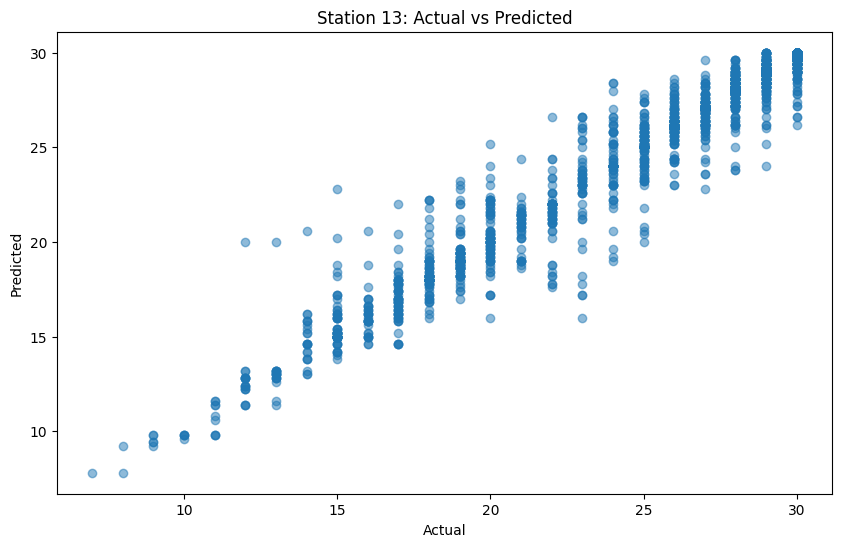

--------------------------------------------------
Number of predictions for station 14: 3013
R^2 Score: 0.9073695630842036
Accuracy: 0.4035844673083306


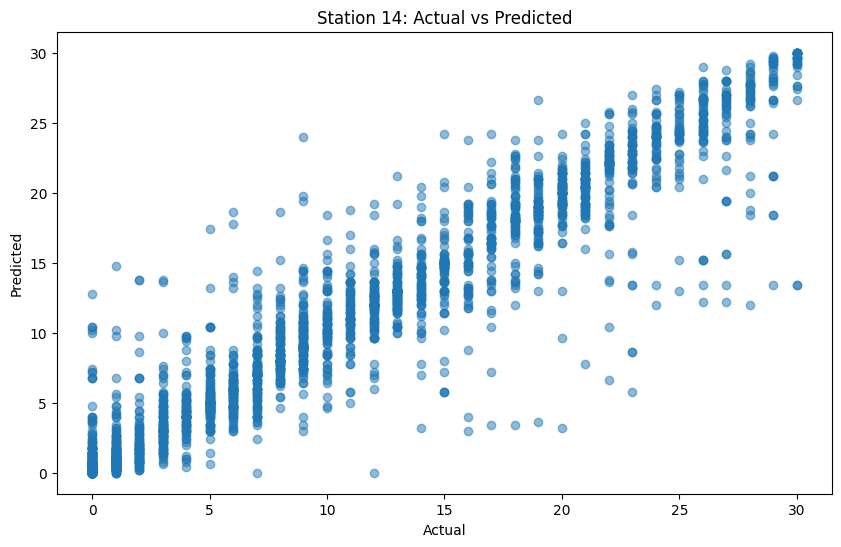

--------------------------------------------------
Number of predictions for station 15: 2648
R^2 Score: 0.9305931028777363
Accuracy: 0.6170694864048338


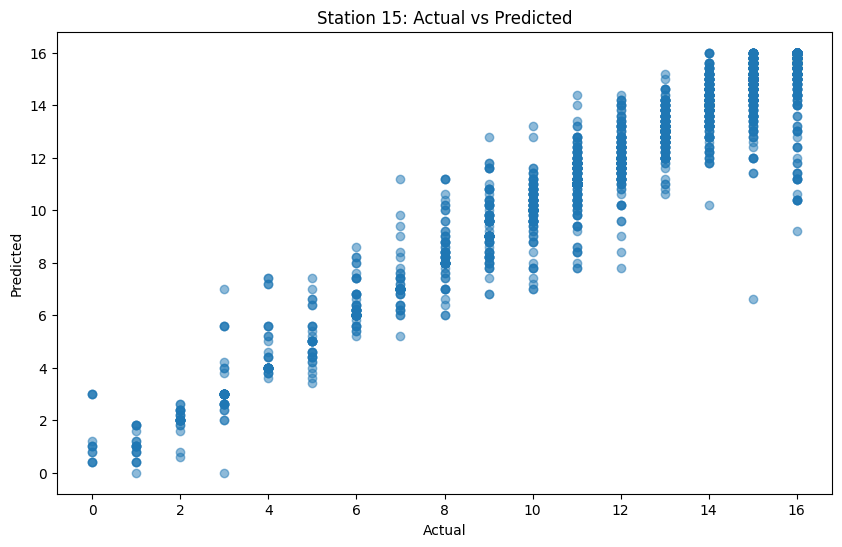

--------------------------------------------------
Number of predictions for station 16: 2725
R^2 Score: 0.9323433444413314
Accuracy: 0.5563302752293579


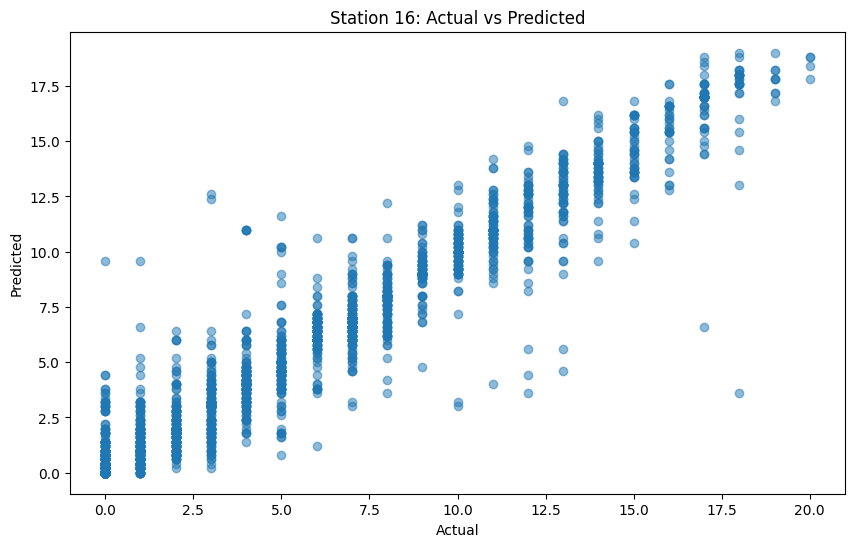

--------------------------------------------------
Number of predictions for station 17: 2605
R^2 Score: 0.9527455084124388
Accuracy: 0.6380038387715931


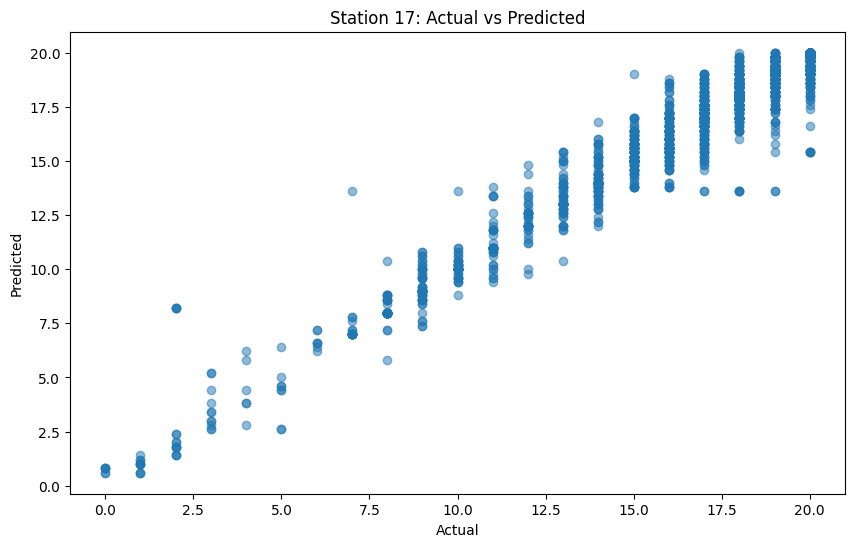

--------------------------------------------------
Number of predictions for station 18: 3015
R^2 Score: 0.9623331872892164
Accuracy: 0.44212271973466005


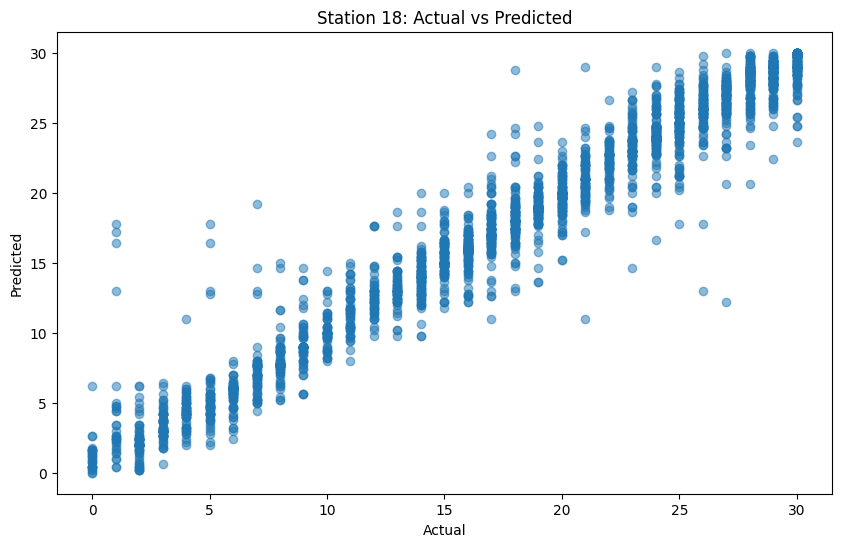

--------------------------------------------------
Number of predictions for station 19: 3096
R^2 Score: 0.9691762613633867
Accuracy: 0.417312661498708


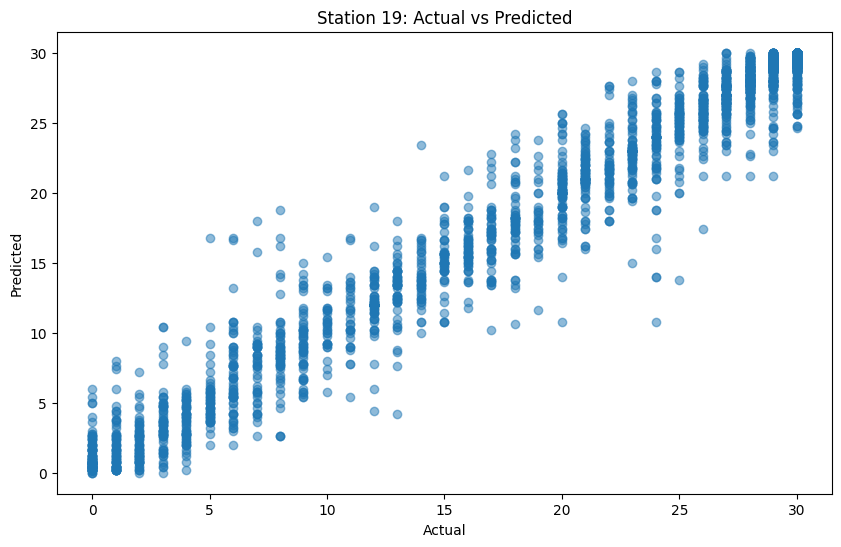

--------------------------------------------------
Number of predictions for station 20: 2712
R^2 Score: 0.9680851064395559
Accuracy: 0.6021386430678466


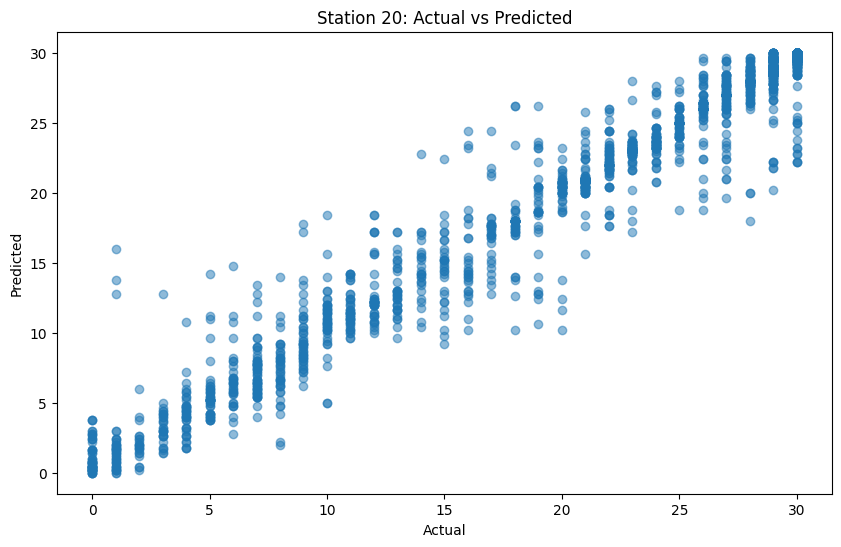

--------------------------------------------------
Number of predictions for station 21: 2901
R^2 Score: 0.9420873746872596
Accuracy: 0.4470872113064461


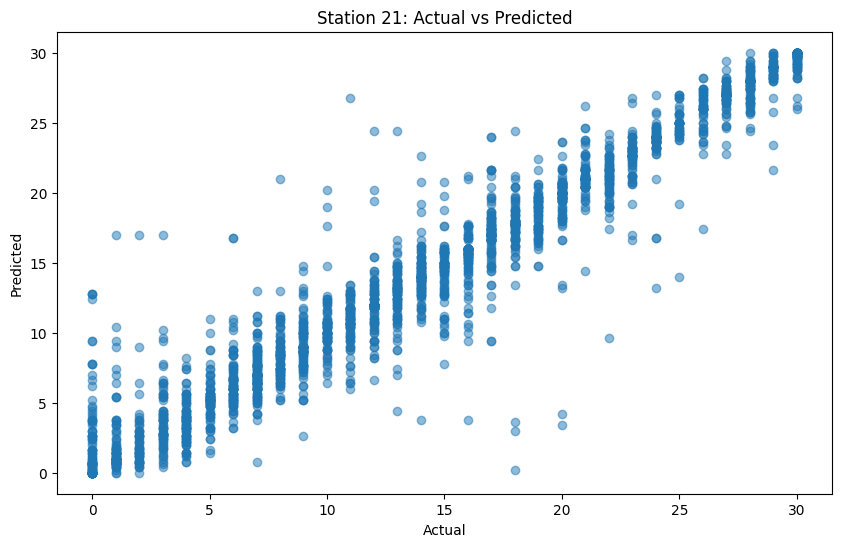

--------------------------------------------------
Number of predictions for station 22: 2928
R^2 Score: 0.9462870442038921
Accuracy: 0.49146174863387976


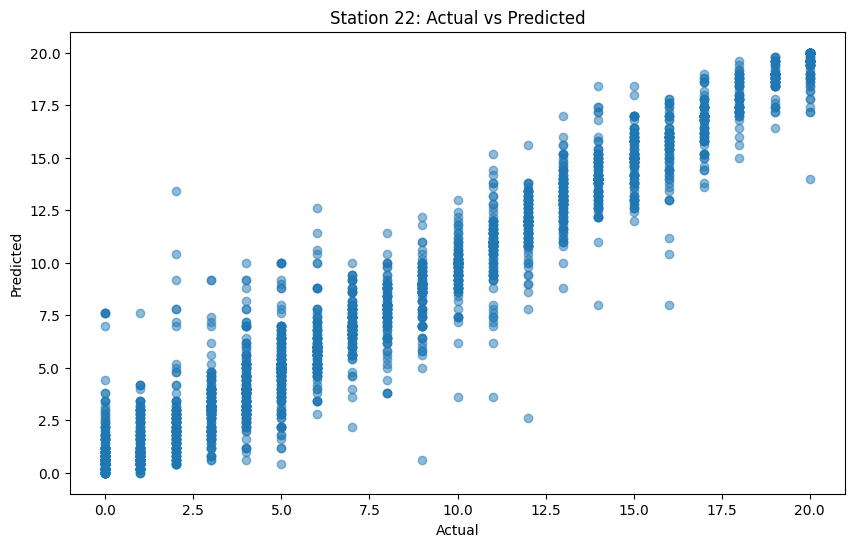

--------------------------------------------------
Number of predictions for station 23: 2942
R^2 Score: 0.9079562673200077
Accuracy: 0.4816451393609789


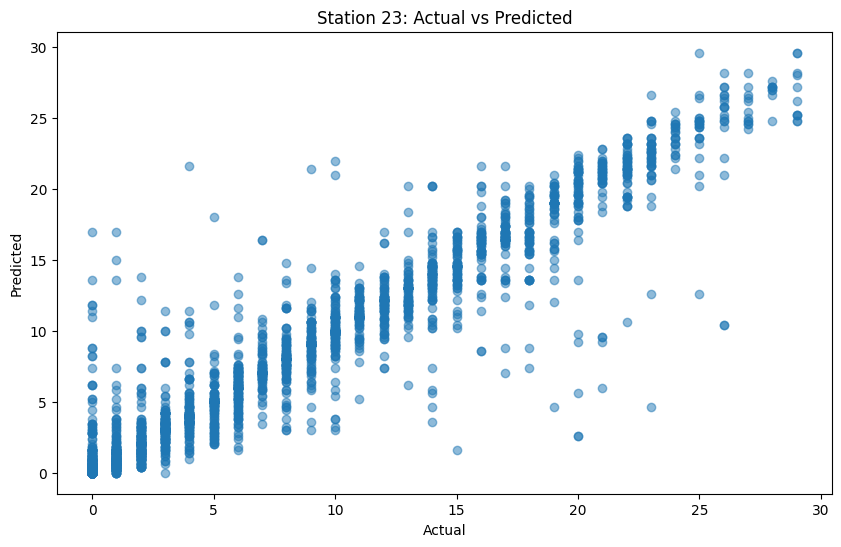

--------------------------------------------------
Number of predictions for station 24: 3046
R^2 Score: 0.9273572698621139
Accuracy: 0.43007222586999344


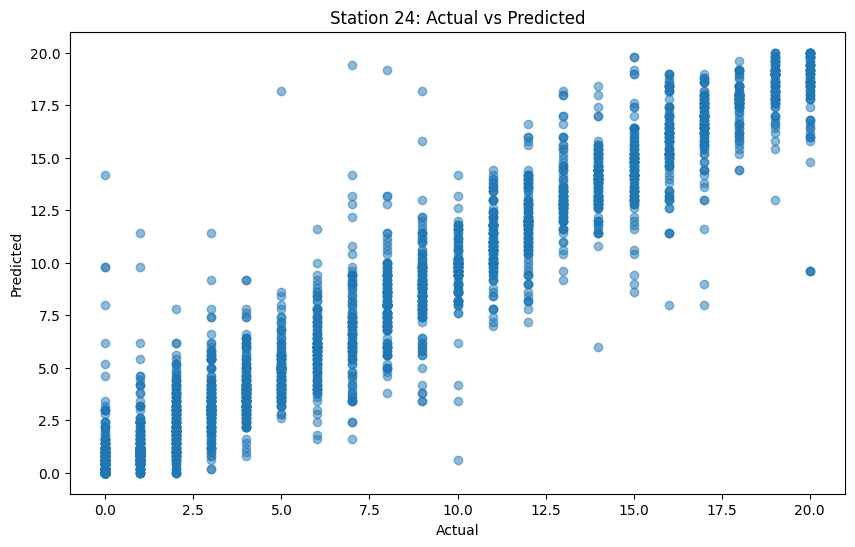

--------------------------------------------------
Number of predictions for station 25: 2667
R^2 Score: 0.9801175334737249
Accuracy: 0.6437945256842894


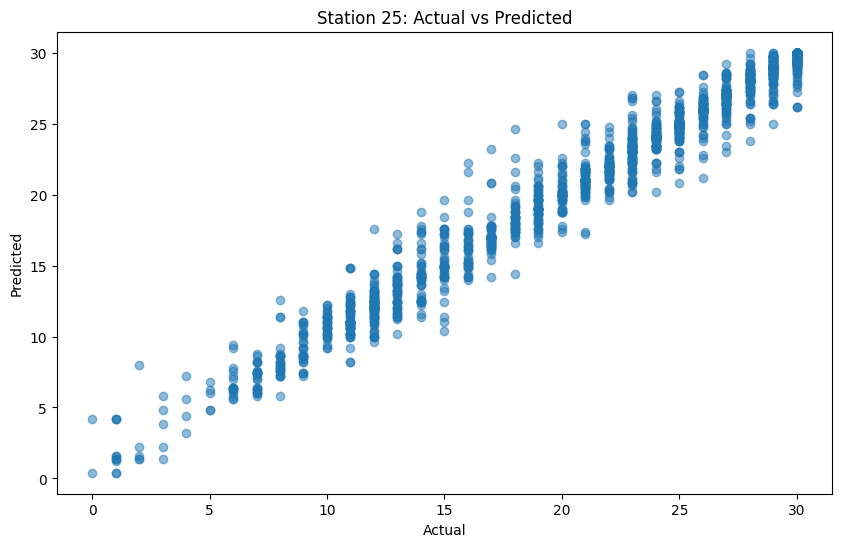

--------------------------------------------------
Number of predictions for station 26: 2727
R^2 Score: 0.9669661513976082
Accuracy: 0.5408874220755409


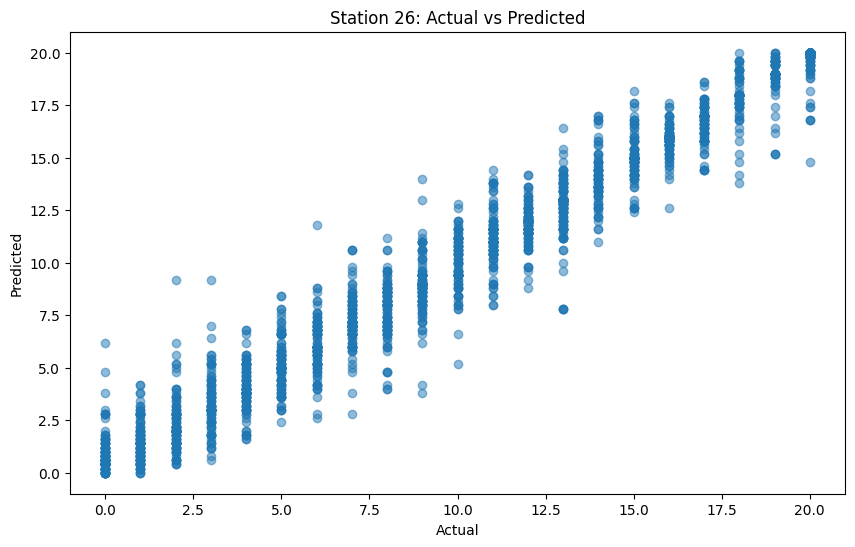

--------------------------------------------------
Number of predictions for station 27: 2846
R^2 Score: 0.9597889548632798
Accuracy: 0.500351370344343


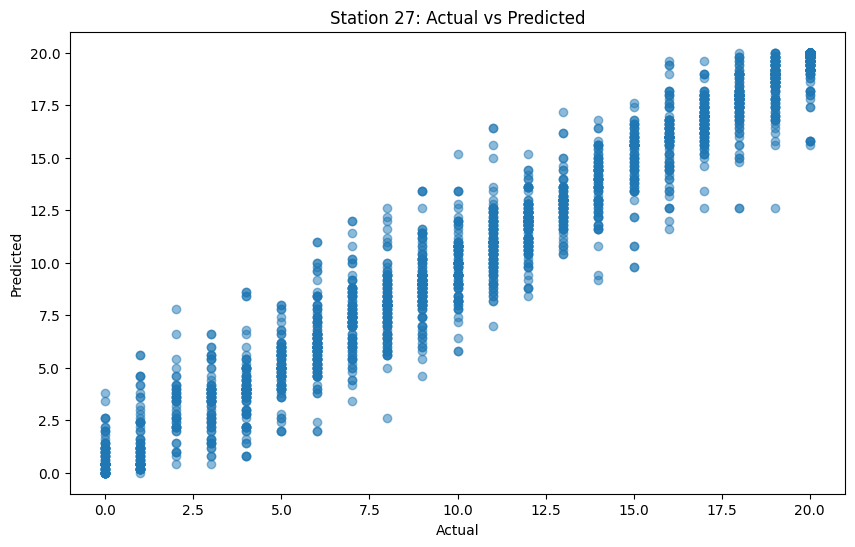

--------------------------------------------------
Number of predictions for station 28: 2786
R^2 Score: 0.8555713815034621
Accuracy: 0.4842067480258435


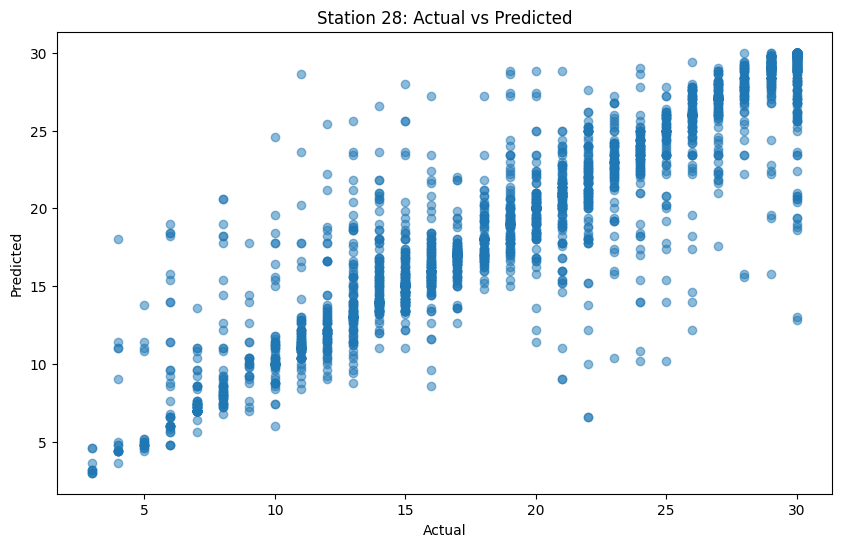

--------------------------------------------------
Number of predictions for station 29: 3004
R^2 Score: 0.9596506469883659
Accuracy: 0.45639147802929425


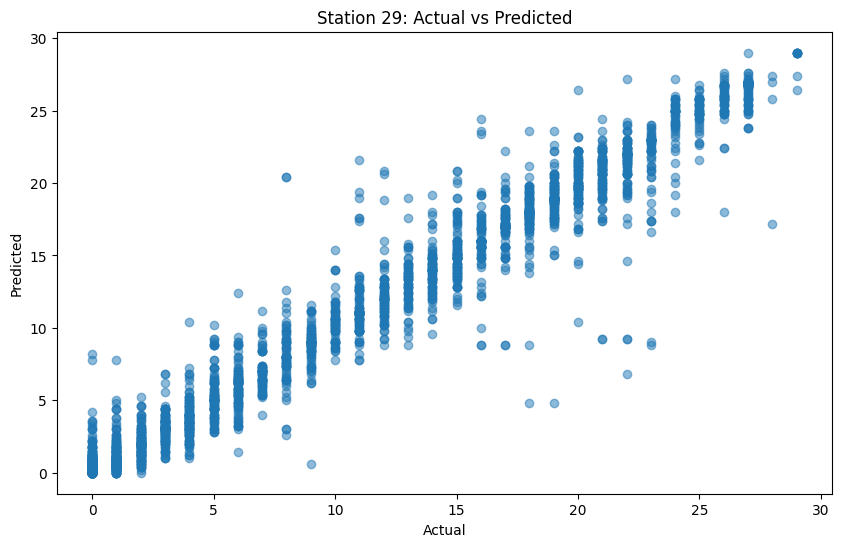

--------------------------------------------------
Number of predictions for station 30: 2543
R^2 Score: 0.9579036013446541
Accuracy: 0.689736531655525


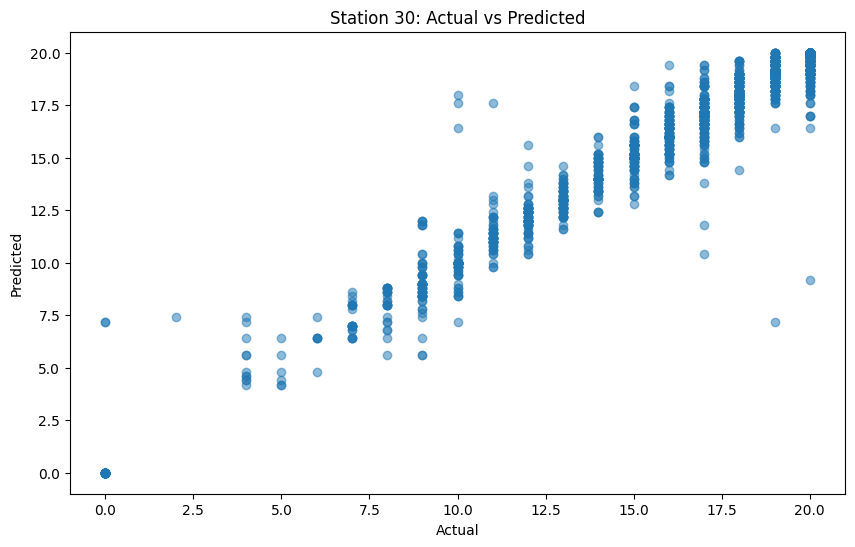

--------------------------------------------------
Number of predictions for station 31: 2940
R^2 Score: 0.8985467601512933
Accuracy: 0.44829931972789117


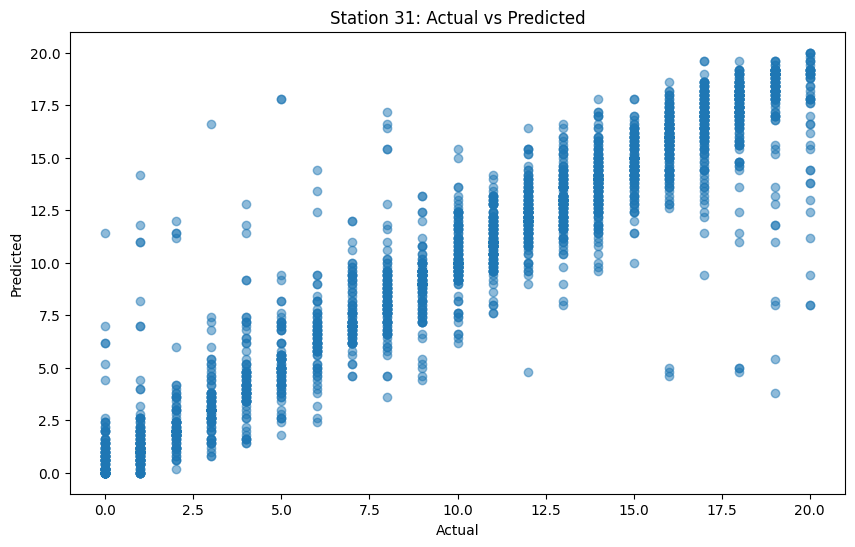

--------------------------------------------------
Number of predictions for station 32: 3031
R^2 Score: 0.9299154029668317
Accuracy: 0.43286044209831737


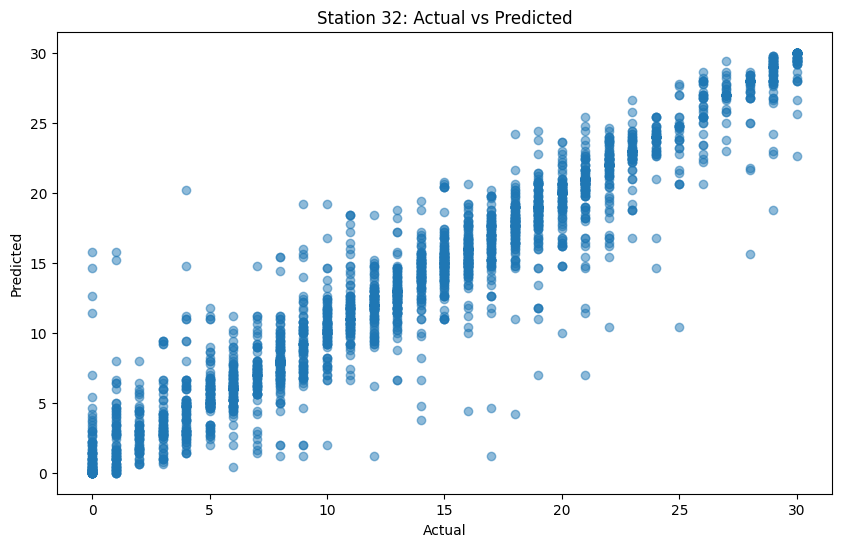

--------------------------------------------------
Number of predictions for station 33: 3227
R^2 Score: 0.787858299494064
Accuracy: 0.3703129841958475


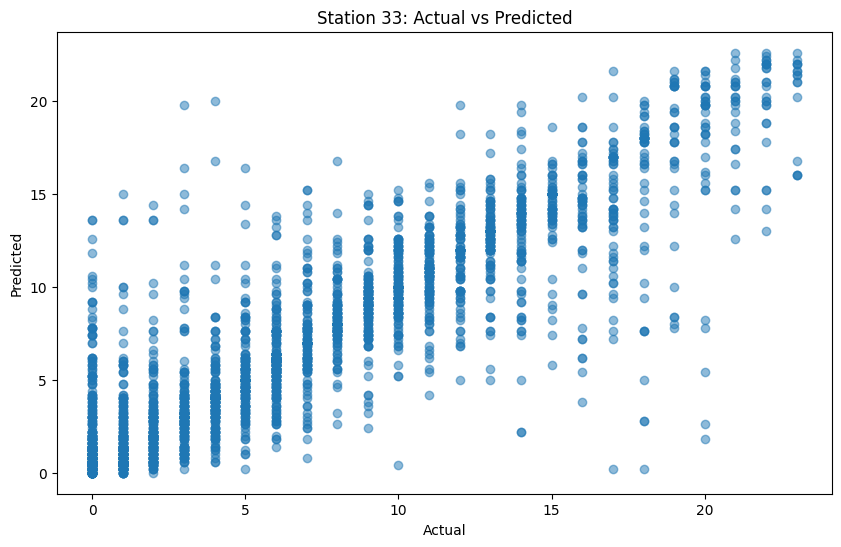

--------------------------------------------------
Number of predictions for station 34: 3122
R^2 Score: 0.9251092141153638
Accuracy: 0.3686739269698911


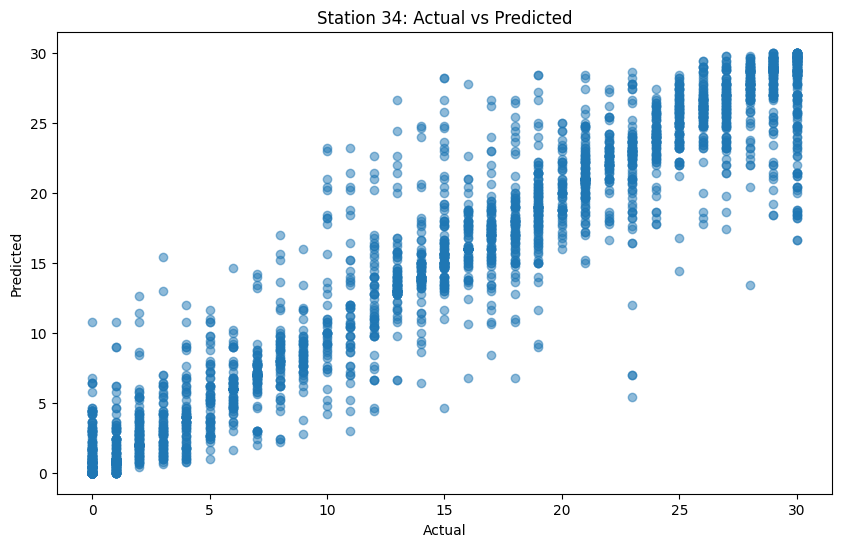

--------------------------------------------------
Number of predictions for station 35: 3002
R^2 Score: 0.9810299451589507
Accuracy: 0.4593604263824117


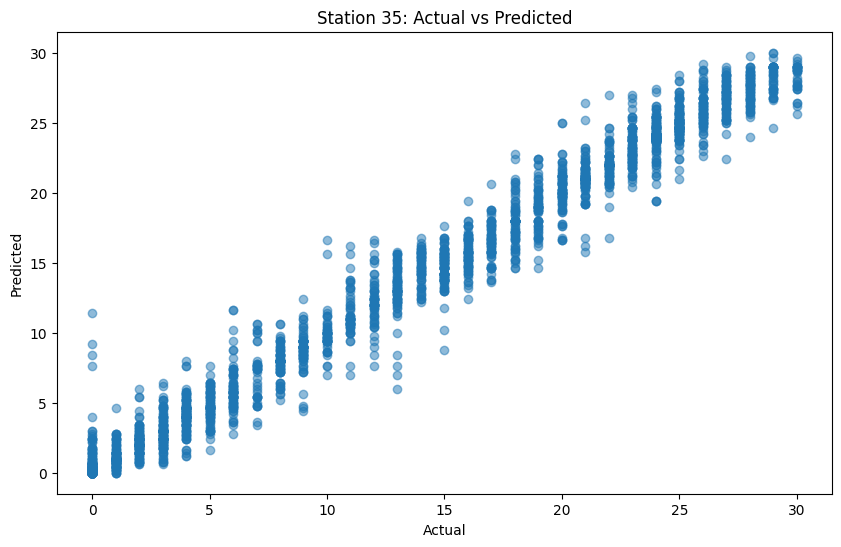

--------------------------------------------------
Number of predictions for station 36: 2777
R^2 Score: 0.9696405976210023
Accuracy: 0.5541951746489017


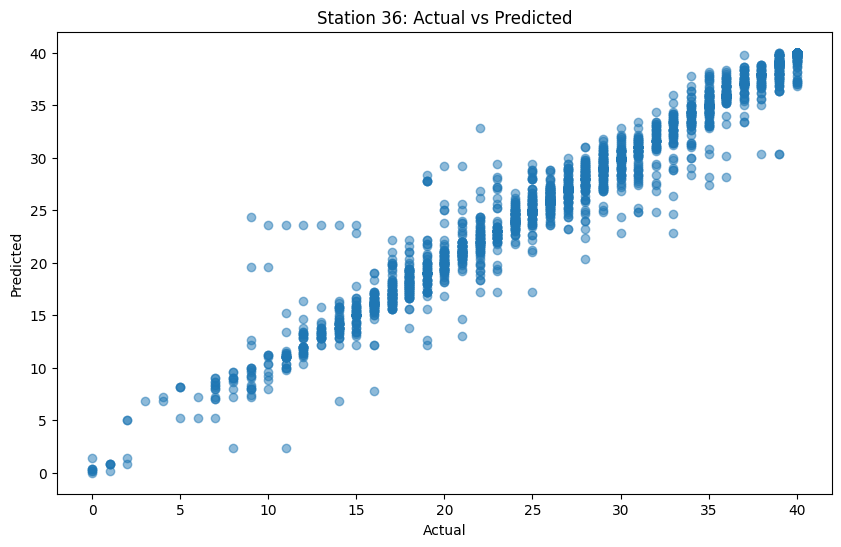

--------------------------------------------------
Number of predictions for station 37: 2476
R^2 Score: 0.9745836262874492
Accuracy: 0.7544426494345718


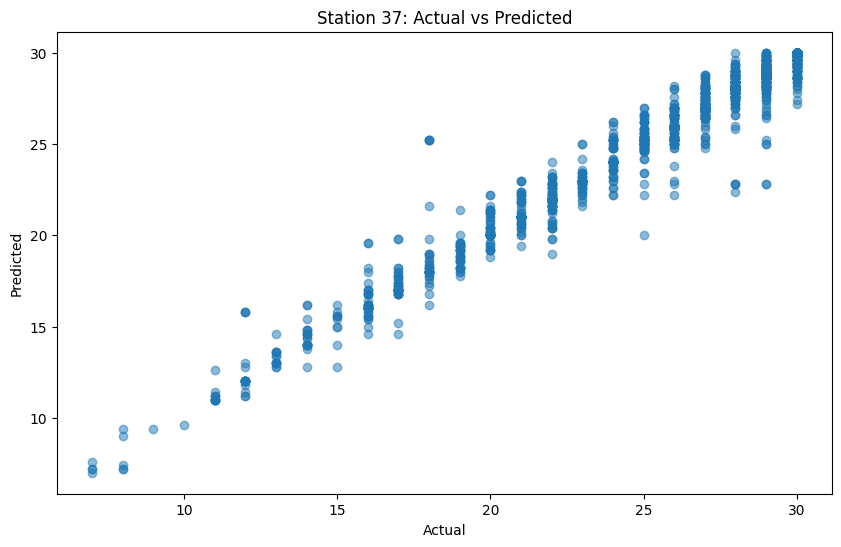

--------------------------------------------------
Number of predictions for station 38: 3125
R^2 Score: 0.9699085329228956
Accuracy: 0.46496


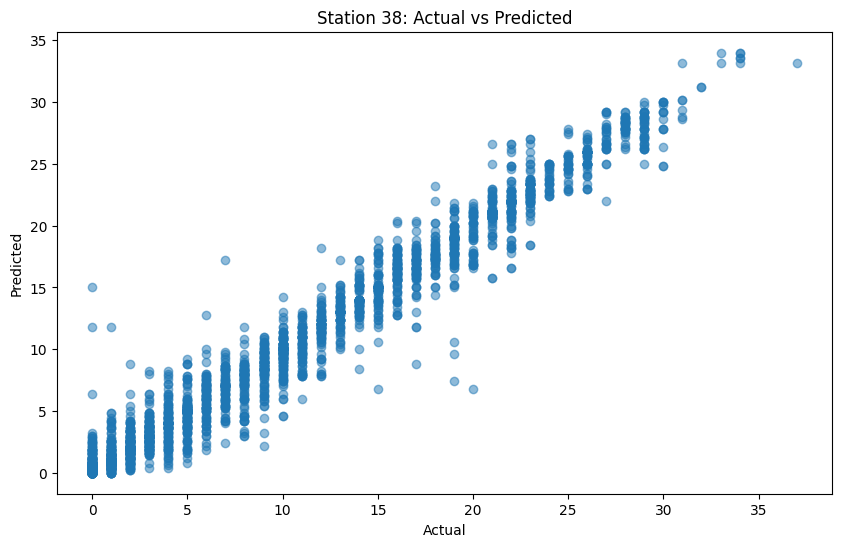

--------------------------------------------------
Number of predictions for station 39: 3029
R^2 Score: 0.9053669750728225
Accuracy: 0.45823704192802905


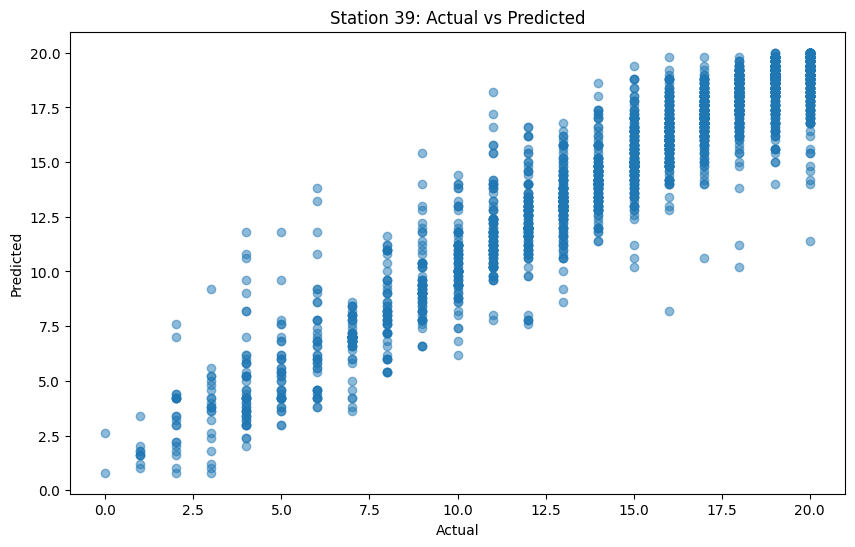

--------------------------------------------------
Number of predictions for station 40: 2933
R^2 Score: 0.9417807313482425
Accuracy: 0.4885782475281282


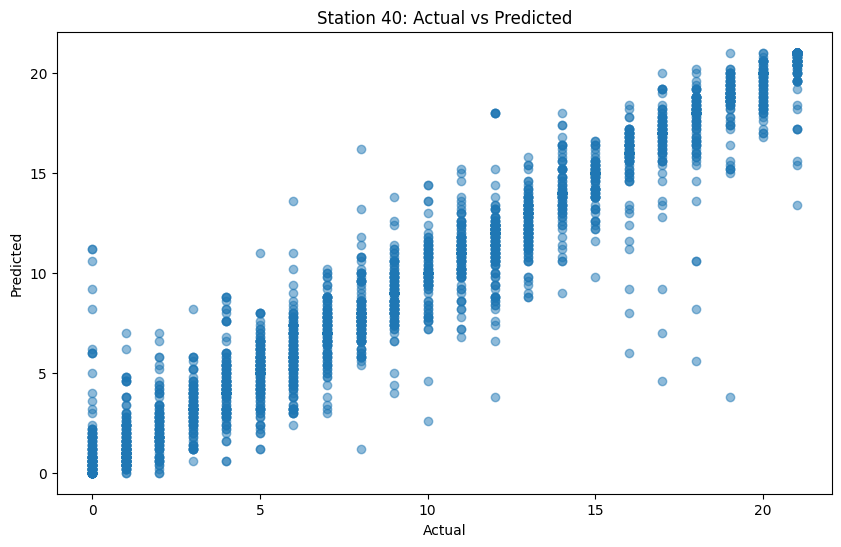

--------------------------------------------------
Number of predictions for station 41: 2602
R^2 Score: 0.9485206503410238
Accuracy: 0.6460415065334358


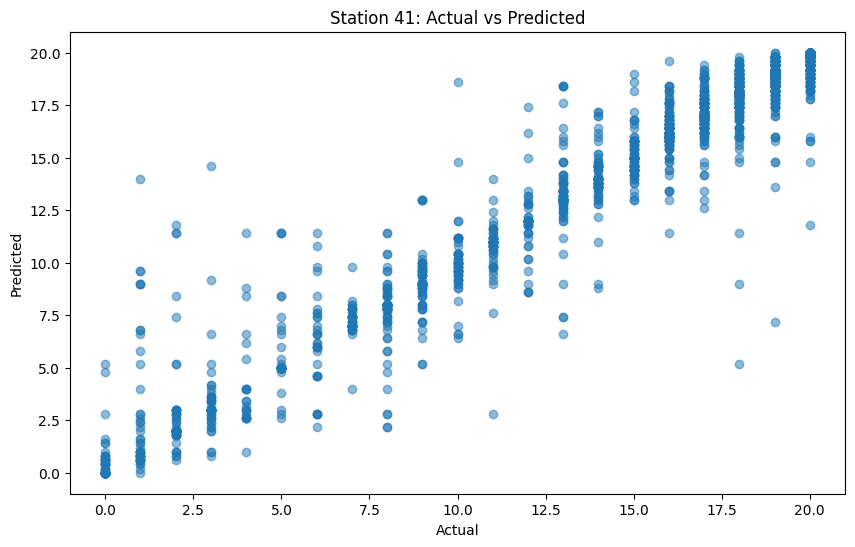

--------------------------------------------------
Number of predictions for station 42: 2897
R^2 Score: 0.9750159859397007
Accuracy: 0.4929237141870901


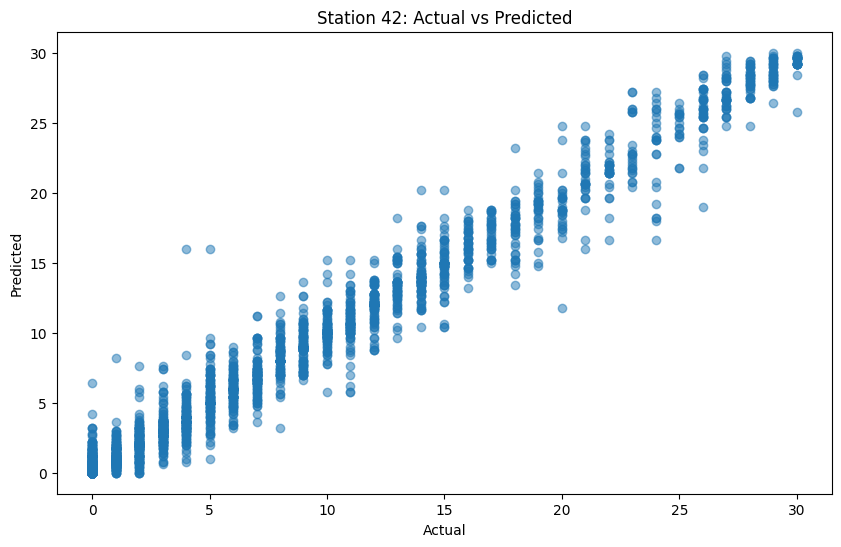

--------------------------------------------------
Number of predictions for station 43: 2851
R^2 Score: 0.9538957608468501
Accuracy: 0.4668537355313925


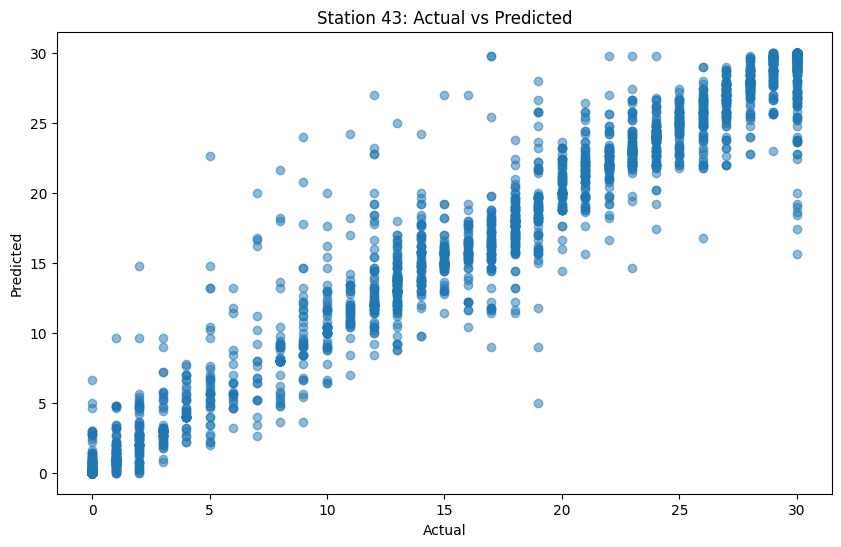

--------------------------------------------------
Number of predictions for station 44: 2763
R^2 Score: 0.9726304347845305
Accuracy: 0.5117625769091567


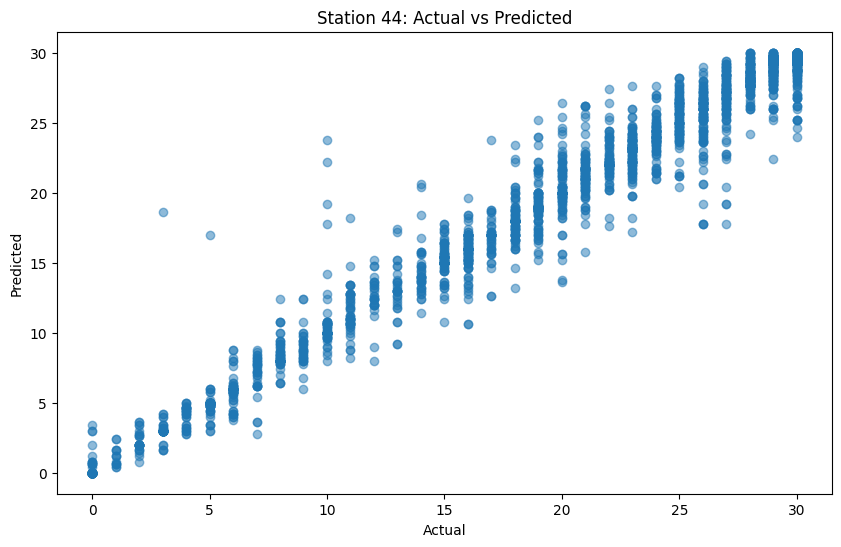

--------------------------------------------------
Number of predictions for station 45: 2769
R^2 Score: 0.9655888823537482
Accuracy: 0.5850487540628385


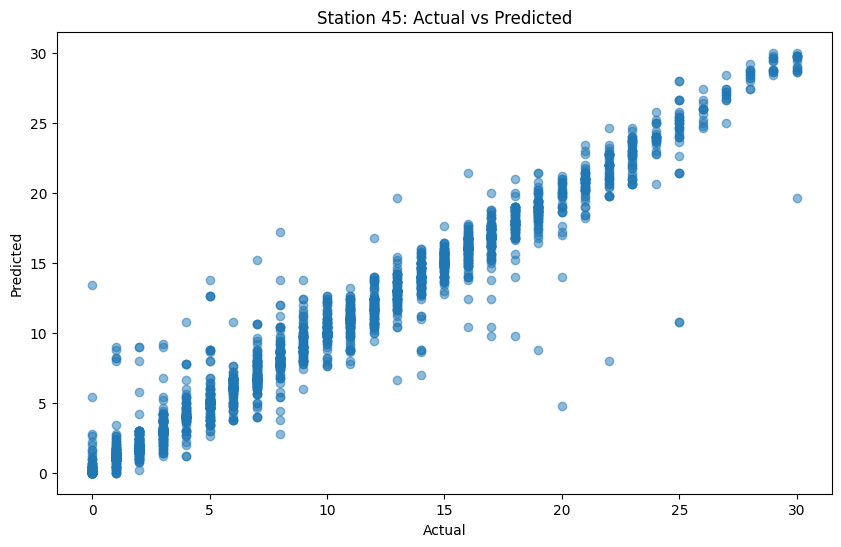

--------------------------------------------------
Number of predictions for station 47: 2584
R^2 Score: 0.9702512364495168
Accuracy: 0.6787925696594427


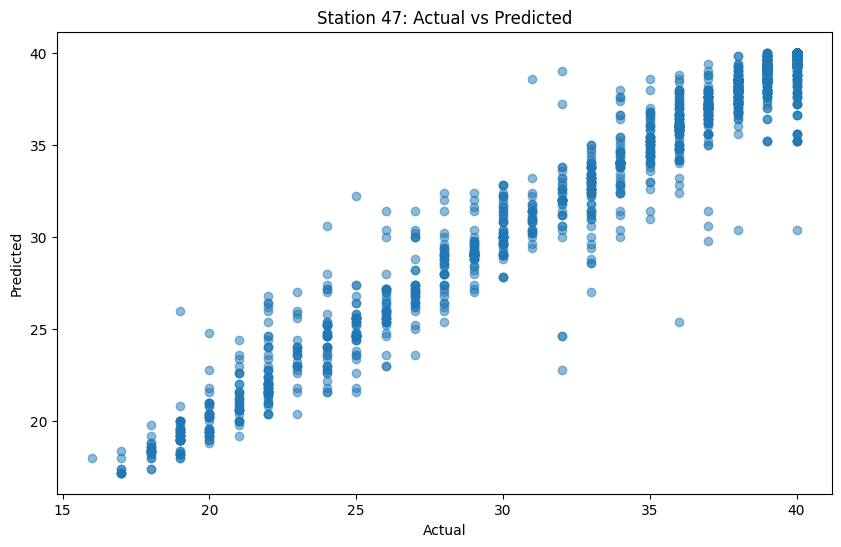

--------------------------------------------------
Number of predictions for station 48: 2816
R^2 Score: 0.9807866496050827
Accuracy: 0.5372869318181818


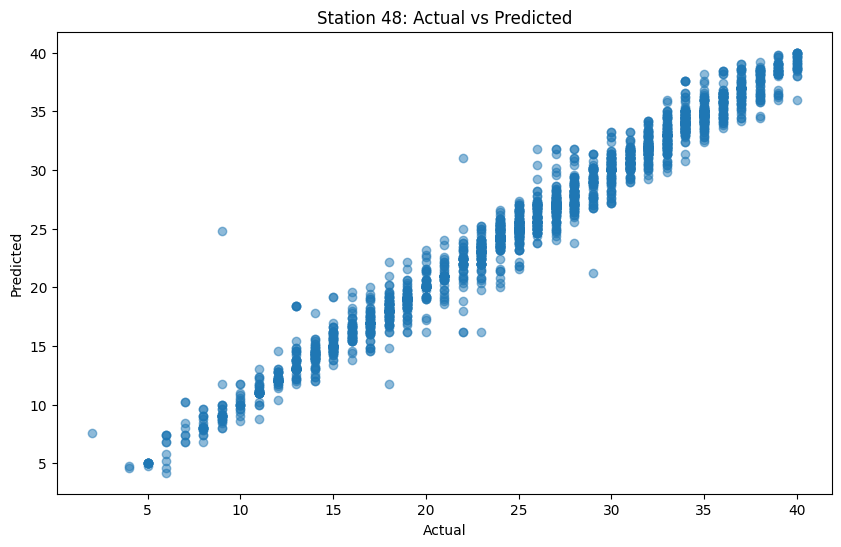

--------------------------------------------------
Number of predictions for station 49: 3057
R^2 Score: 0.9691400145126063
Accuracy: 0.4147857376512921


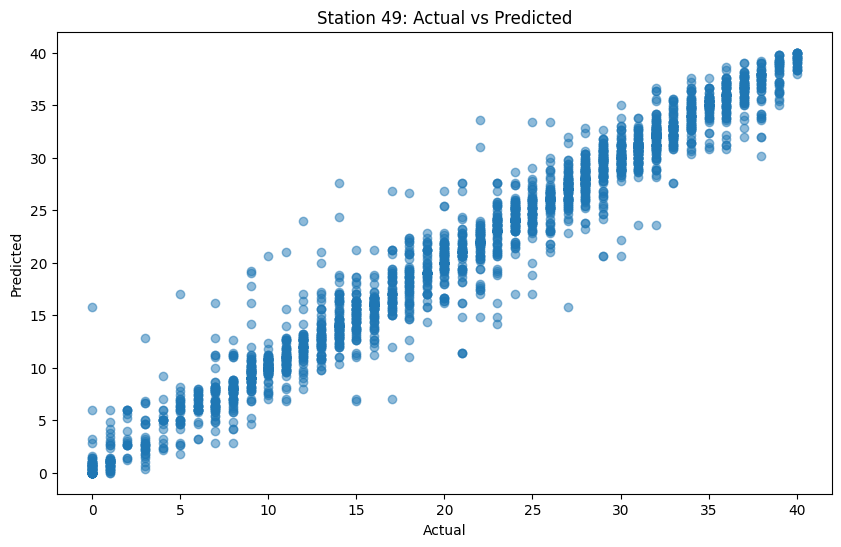

--------------------------------------------------
Number of predictions for station 50: 2998
R^2 Score: 0.9794066545328997
Accuracy: 0.45030020013342226


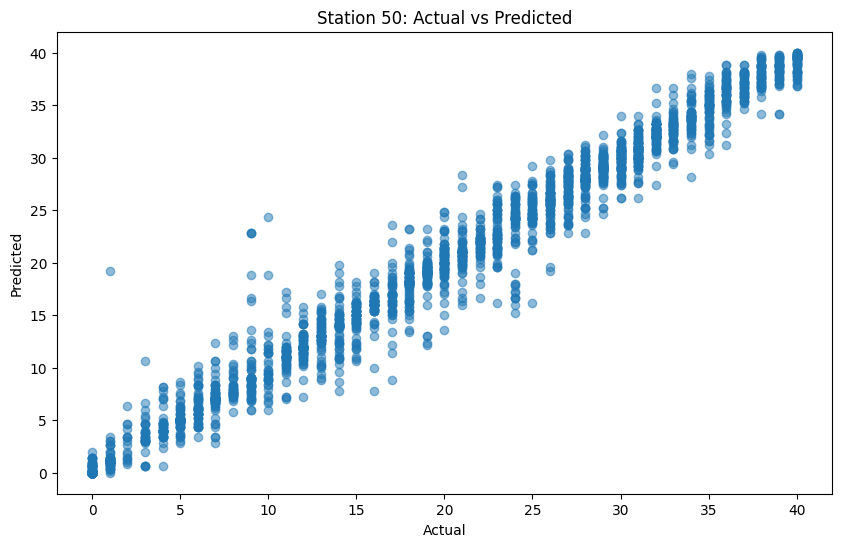

--------------------------------------------------
Number of predictions for station 51: 2581
R^2 Score: 0.9847914327376774
Accuracy: 0.6702828361100349


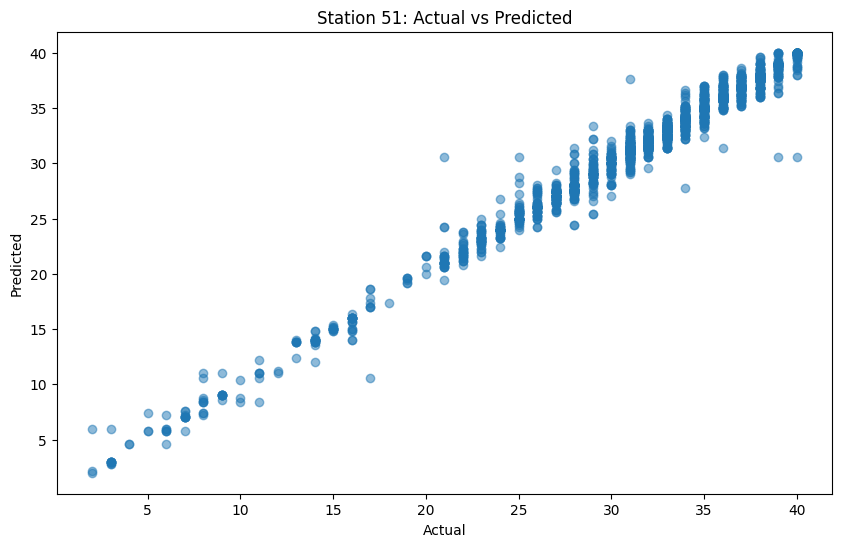

--------------------------------------------------
Number of predictions for station 52: 2615
R^2 Score: 0.9762800113707264
Accuracy: 0.5613766730401529


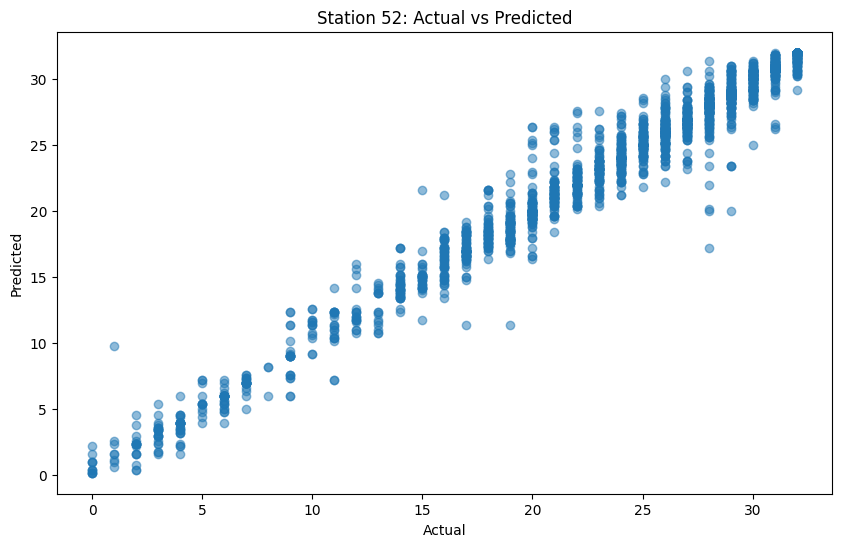

--------------------------------------------------
Number of predictions for station 53: 2491
R^2 Score: 0.9674211561750627
Accuracy: 0.7607386591730229


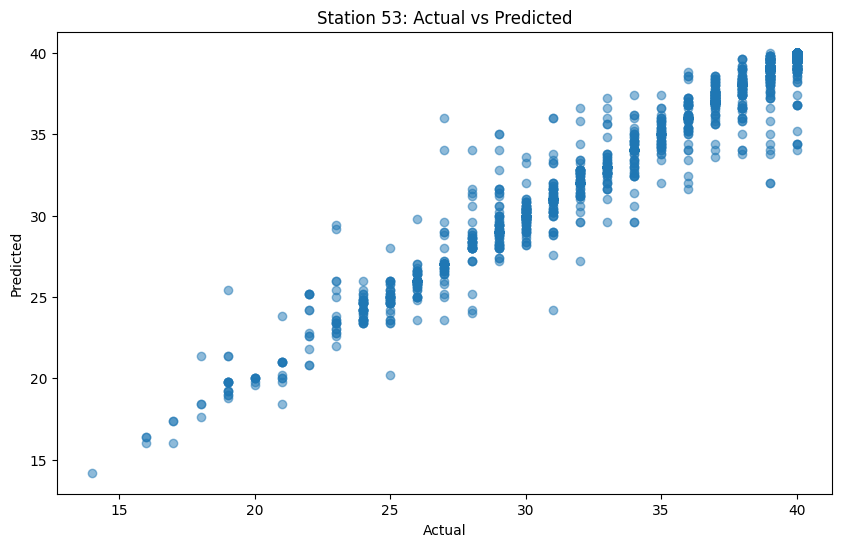

--------------------------------------------------
Number of predictions for station 54: 2645
R^2 Score: 0.9823824335307898
Accuracy: 0.6294896030245747


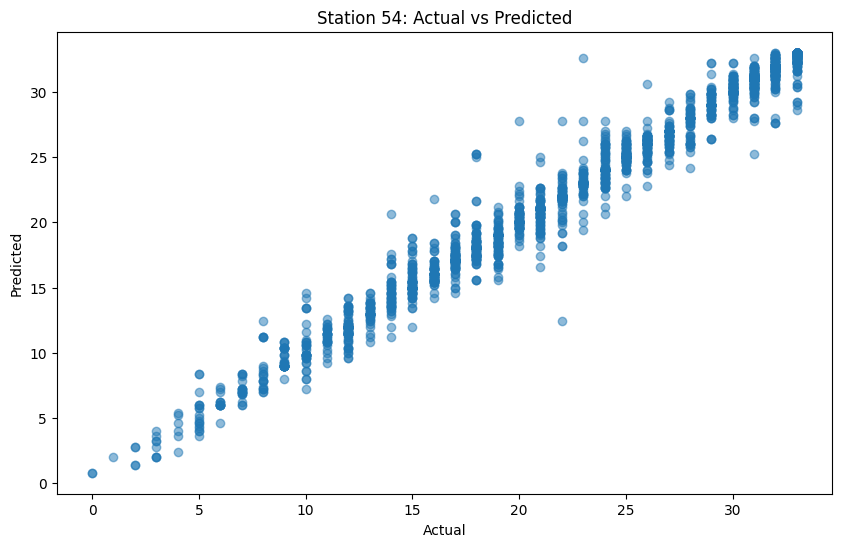

--------------------------------------------------
Number of predictions for station 55: 2623
R^2 Score: 0.9685301891448388
Accuracy: 0.6690812047274114


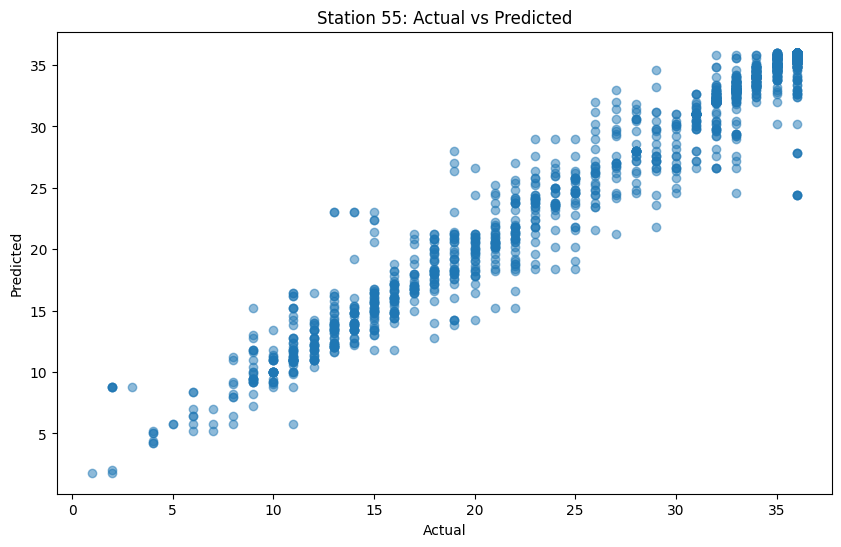

--------------------------------------------------
Number of predictions for station 56: 2951
R^2 Score: 0.9667299427791513
Accuracy: 0.43612334801762115


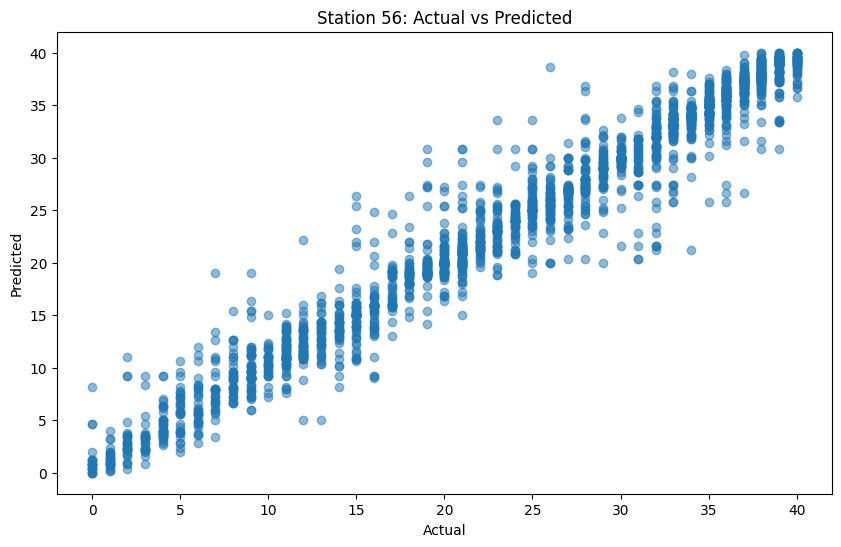

--------------------------------------------------
Number of predictions for station 57: 2599
R^2 Score: 0.9752997027058563
Accuracy: 0.639091958445556


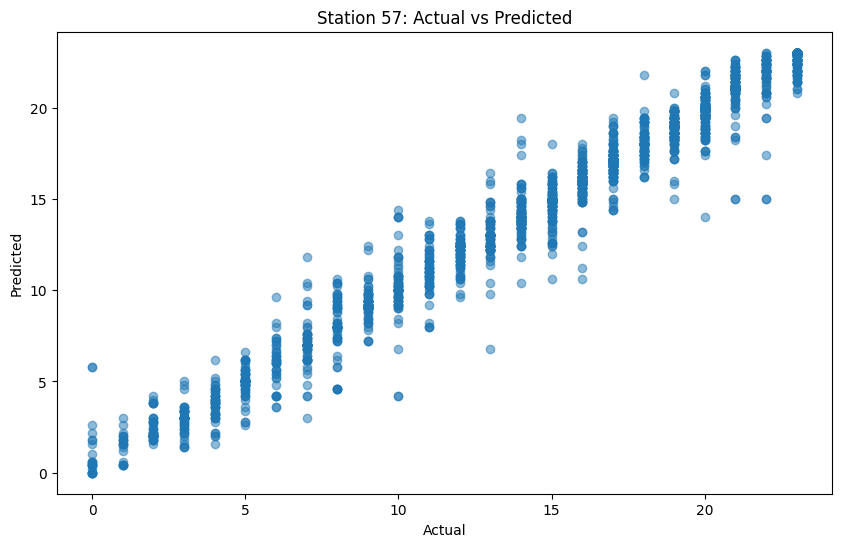

--------------------------------------------------
Number of predictions for station 58: 3126
R^2 Score: 0.9492083371924774
Accuracy: 0.3854766474728087


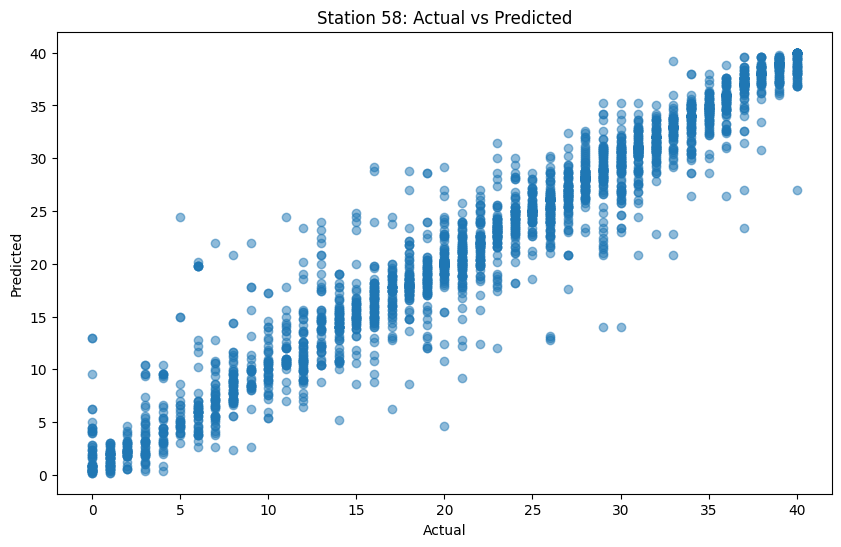

--------------------------------------------------
Number of predictions for station 59: 2622
R^2 Score: 0.9371393642712651
Accuracy: 0.6418764302059496


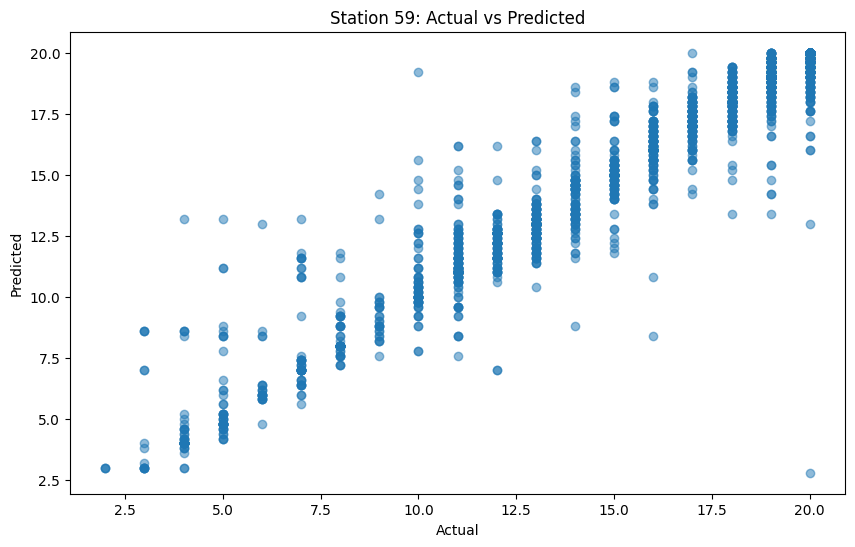

--------------------------------------------------
Number of predictions for station 60: 3001
R^2 Score: 0.9574009106044944
Accuracy: 0.4221926024658447


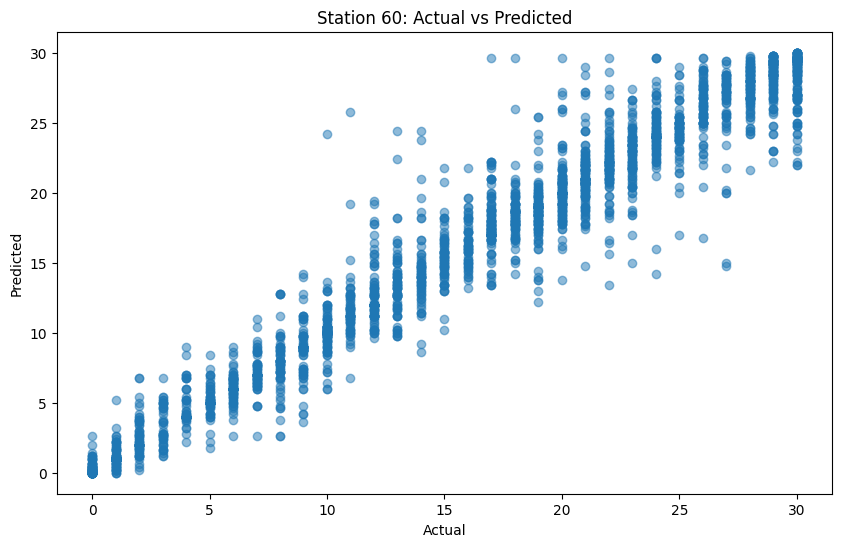

--------------------------------------------------
Number of predictions for station 61: 2518
R^2 Score: 0.9615092056462395
Accuracy: 0.6961874503574266


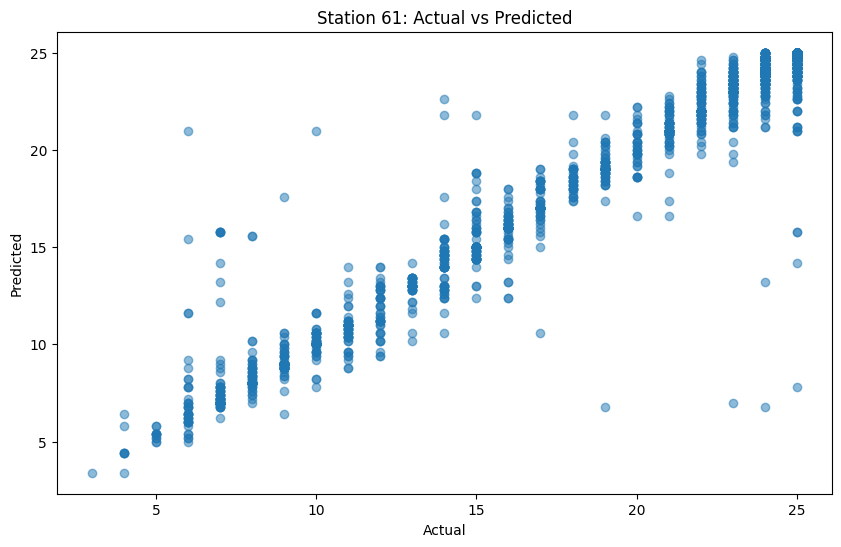

--------------------------------------------------
Number of predictions for station 62: 2853
R^2 Score: 0.9781589583445317
Accuracy: 0.5026288117770767


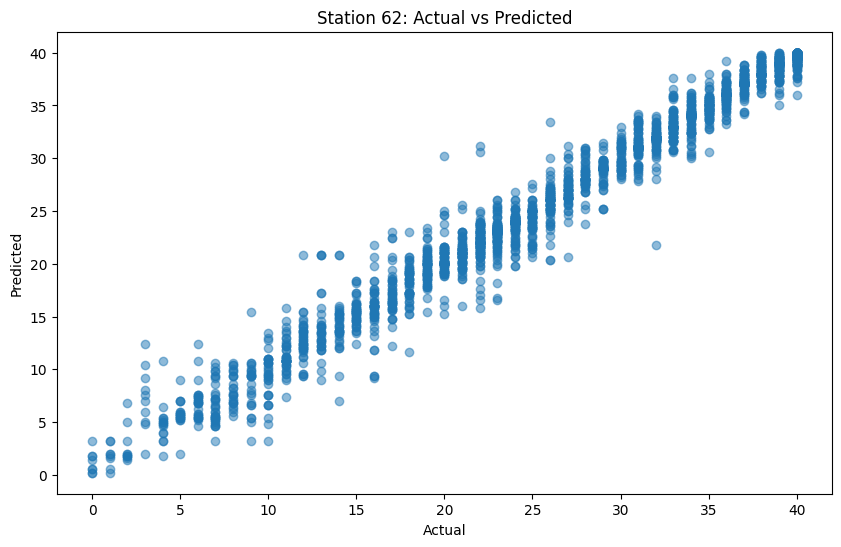

--------------------------------------------------
Number of predictions for station 63: 2760
R^2 Score: 0.9726759316530746
Accuracy: 0.5528985507246377


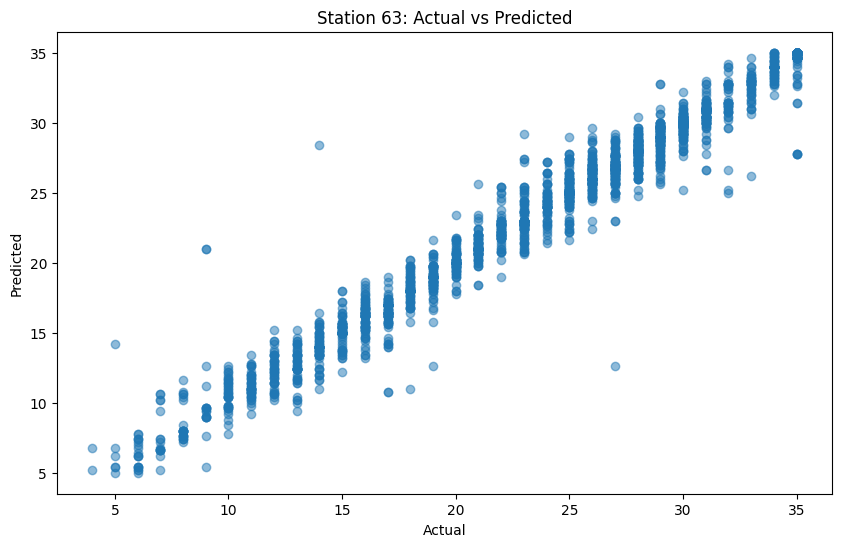

--------------------------------------------------
Number of predictions for station 64: 2950
R^2 Score: 0.9503879034852267
Accuracy: 0.49830508474576274


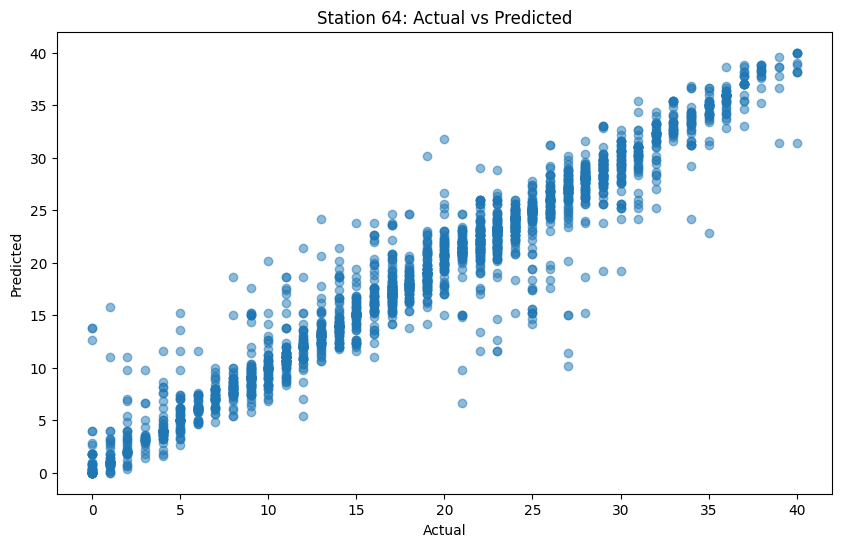

--------------------------------------------------
Number of predictions for station 65: 2542
R^2 Score: 0.9504568636538298
Accuracy: 0.5177025963808025


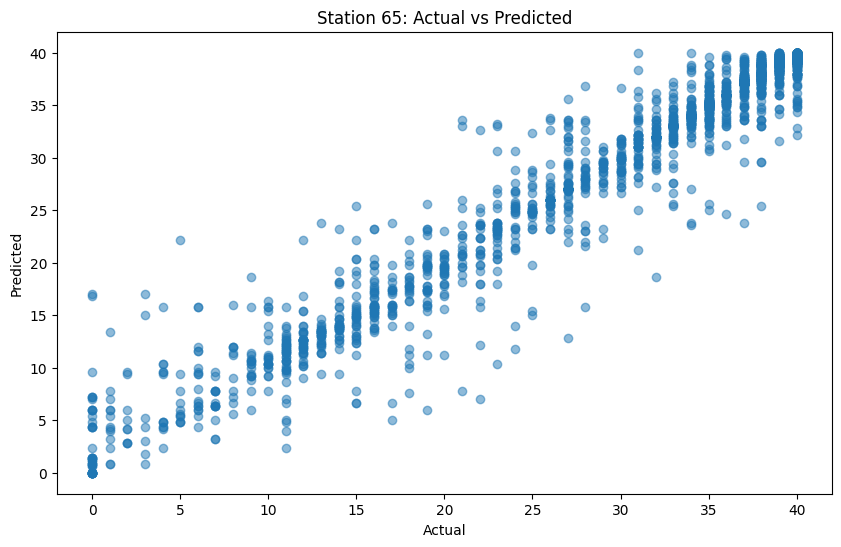

--------------------------------------------------
Number of predictions for station 66: 2850
R^2 Score: 0.9450127588634759
Accuracy: 0.416140350877193


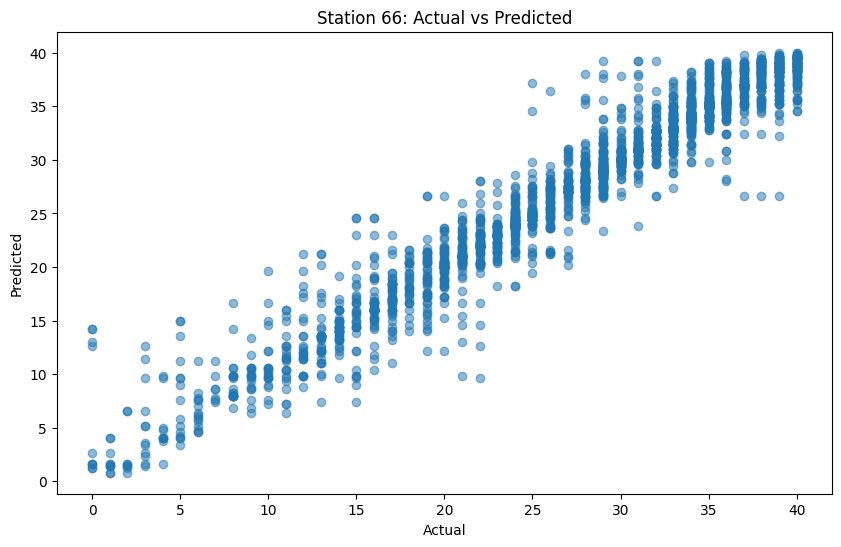

--------------------------------------------------
Number of predictions for station 67: 3051
R^2 Score: 0.9627081373507305
Accuracy: 0.4165847263192396


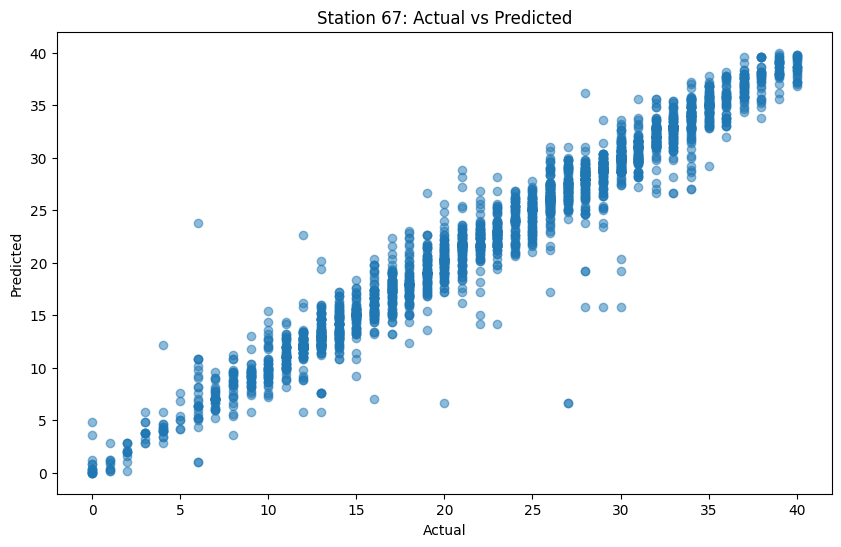

--------------------------------------------------
Number of predictions for station 68: 3045
R^2 Score: 0.9696532482847138
Accuracy: 0.4174055829228243


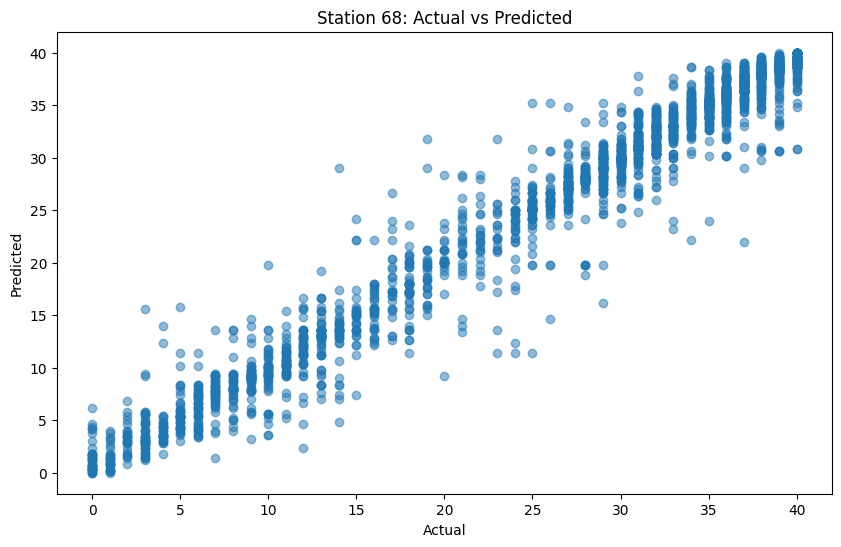

--------------------------------------------------
Number of predictions for station 69: 3367
R^2 Score: 0.9616444105137363
Accuracy: 0.35580635580635583


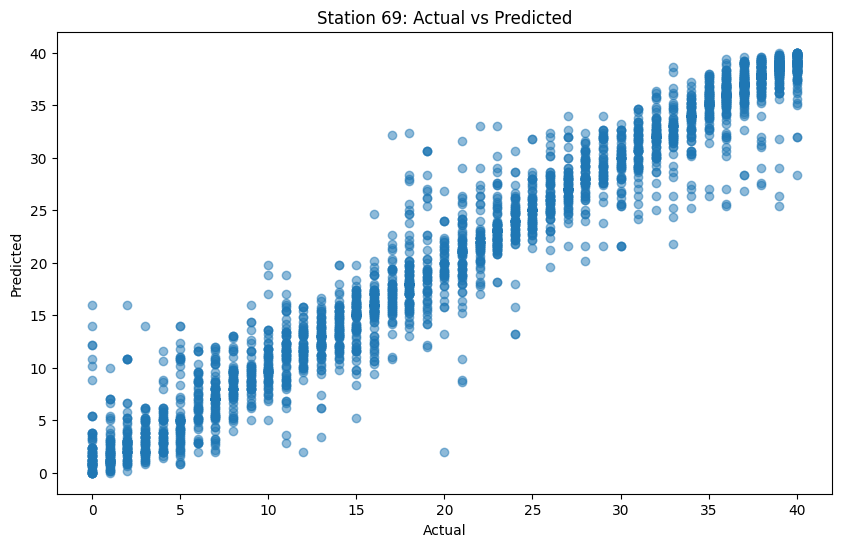

--------------------------------------------------
Number of predictions for station 71: 2735
R^2 Score: 0.9612714163439323
Accuracy: 0.5385740402193784


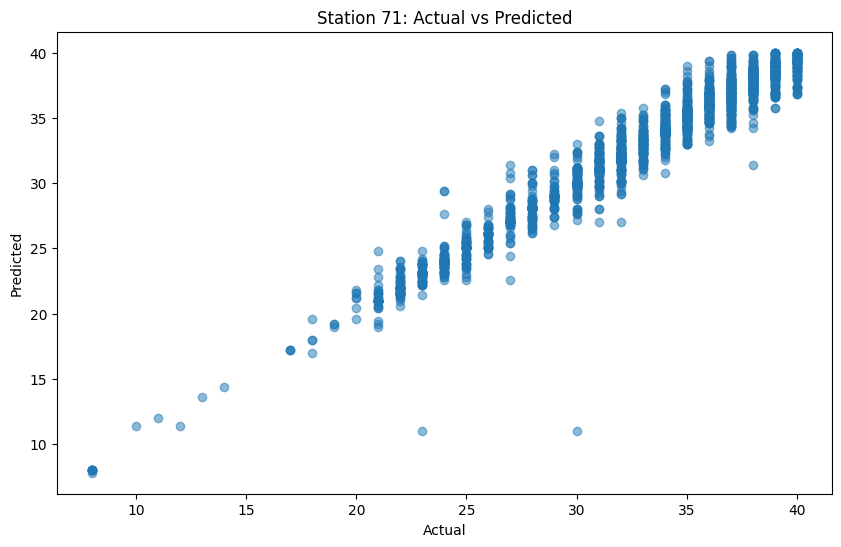

--------------------------------------------------
Number of predictions for station 72: 2730
R^2 Score: 0.9262095185201467
Accuracy: 0.5406593406593406


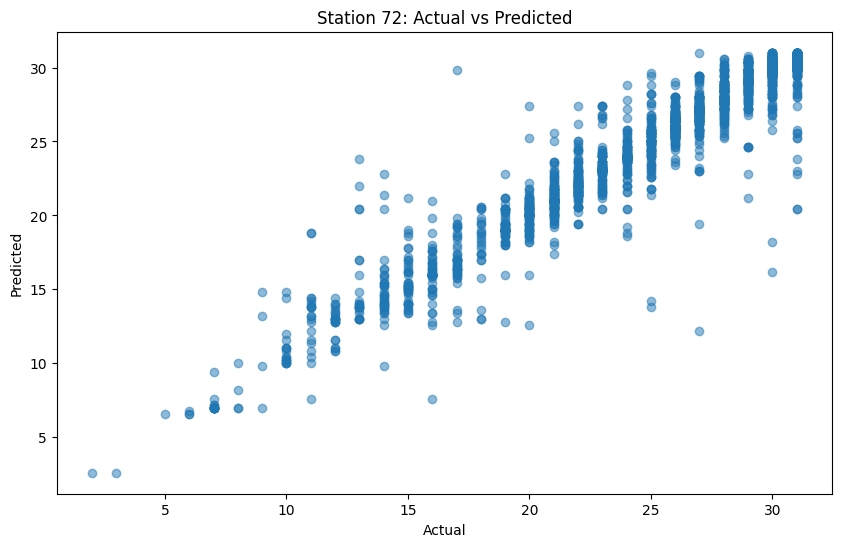

--------------------------------------------------
Number of predictions for station 73: 2843
R^2 Score: 0.9435094087668929
Accuracy: 0.47907140344706295


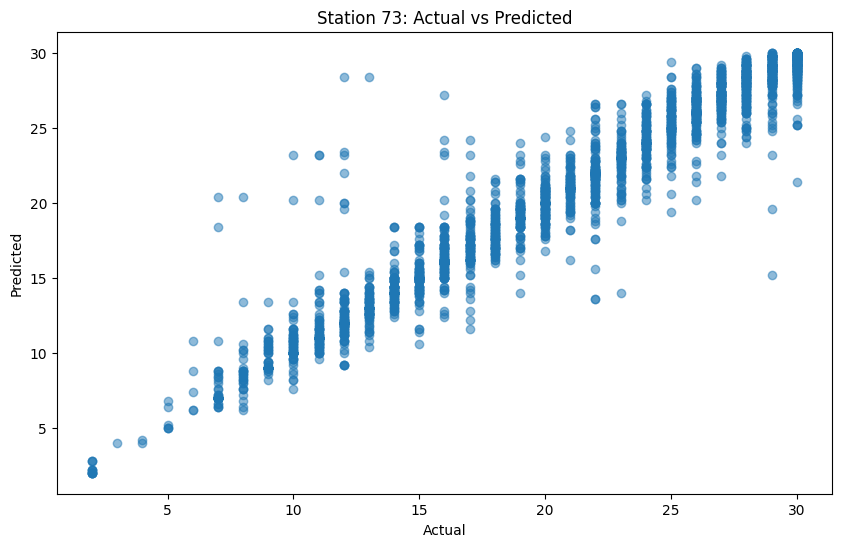

--------------------------------------------------
Number of predictions for station 74: 2732
R^2 Score: 0.9699675911716349
Accuracy: 0.5574670571010248


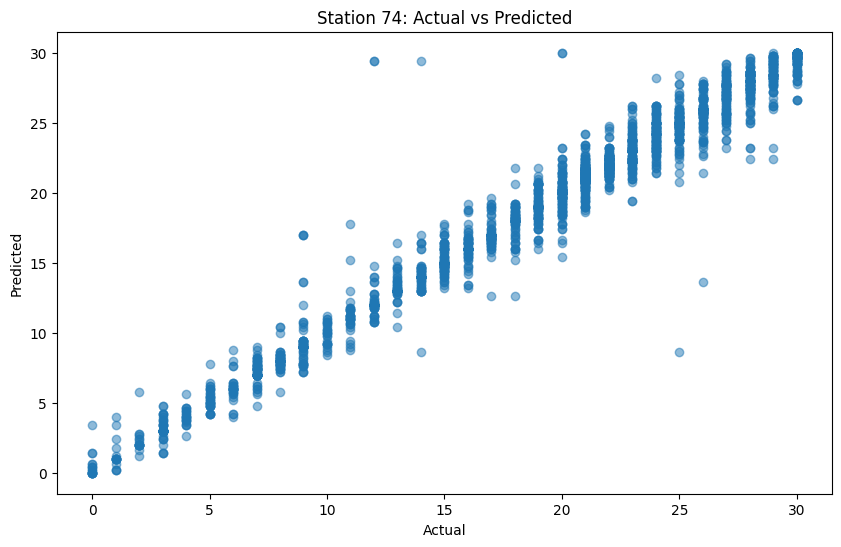

--------------------------------------------------
Number of predictions for station 75: 2778
R^2 Score: 0.9653453796211918
Accuracy: 0.5831533477321814


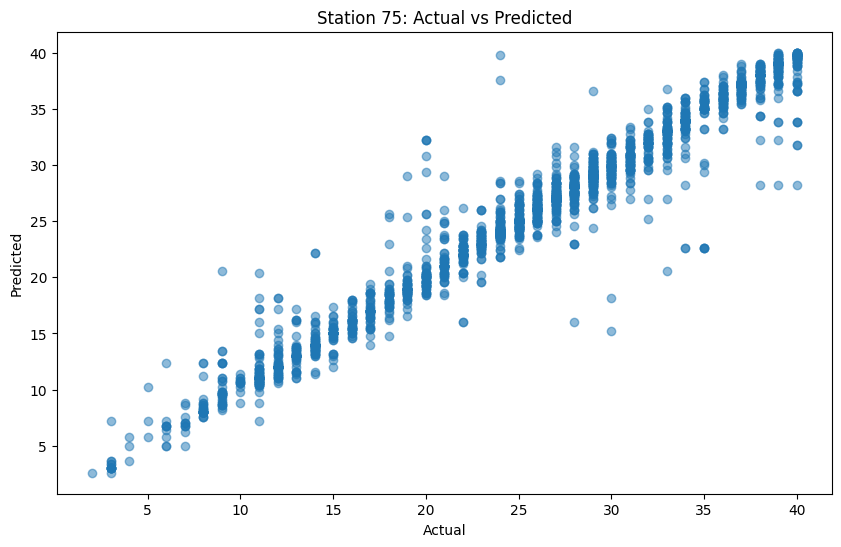

--------------------------------------------------
Number of predictions for station 76: 2600
R^2 Score: 0.9431157224898017
Accuracy: 0.6015384615384616


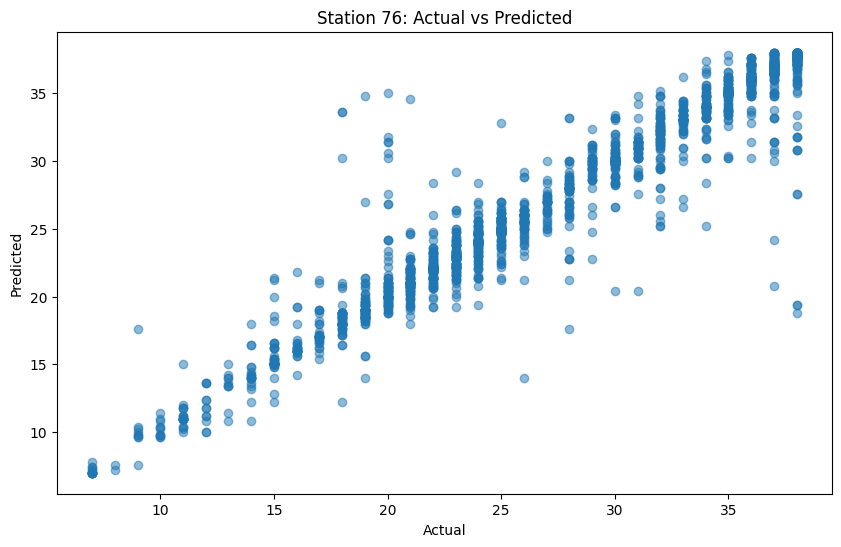

--------------------------------------------------
Number of predictions for station 77: 2856
R^2 Score: 0.9789262593136077
Accuracy: 0.5073529411764706


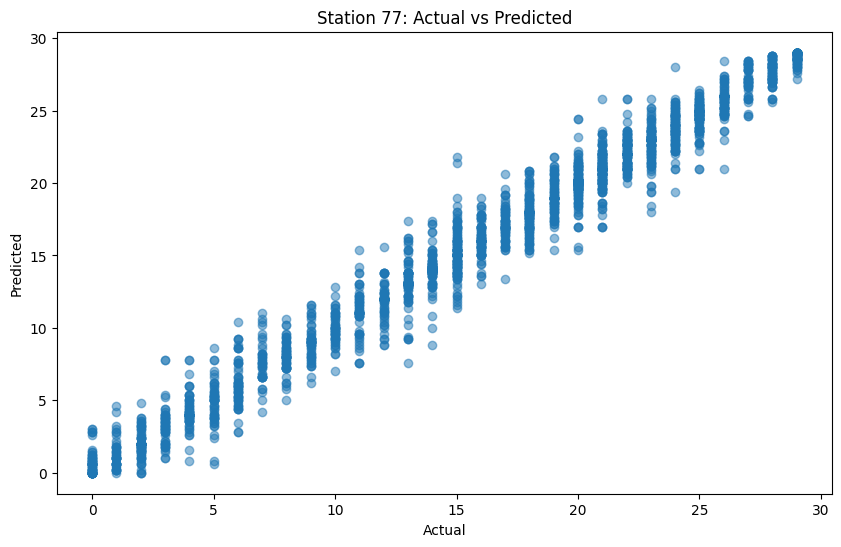

--------------------------------------------------
Number of predictions for station 78: 2705
R^2 Score: 0.9713689386098584
Accuracy: 0.5611829944547135


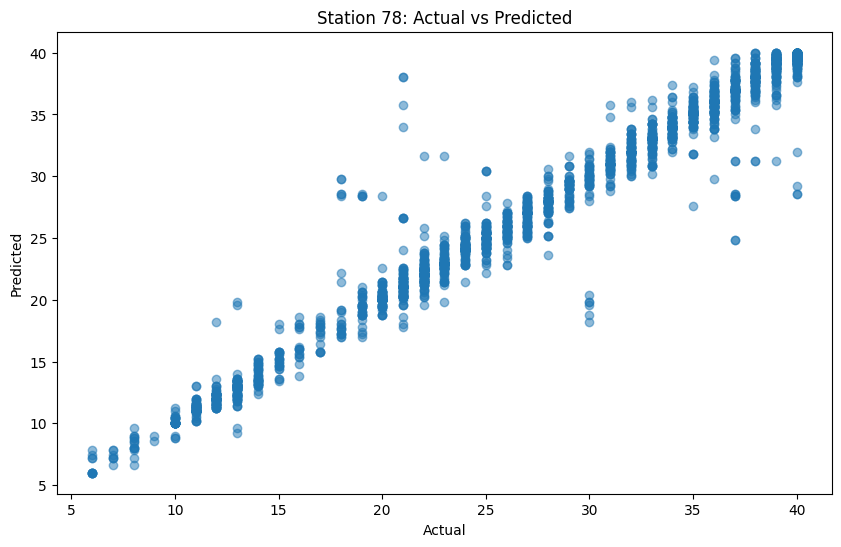

--------------------------------------------------
Number of predictions for station 79: 2479
R^2 Score: 0.9501201751286918
Accuracy: 0.7648245260185559


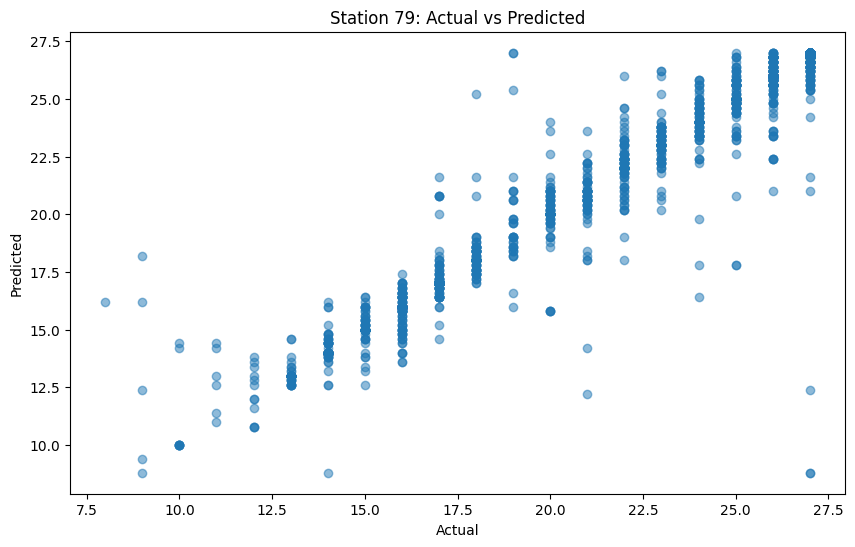

--------------------------------------------------
Number of predictions for station 80: 2703
R^2 Score: 0.9469531505203816
Accuracy: 0.6448390677025527


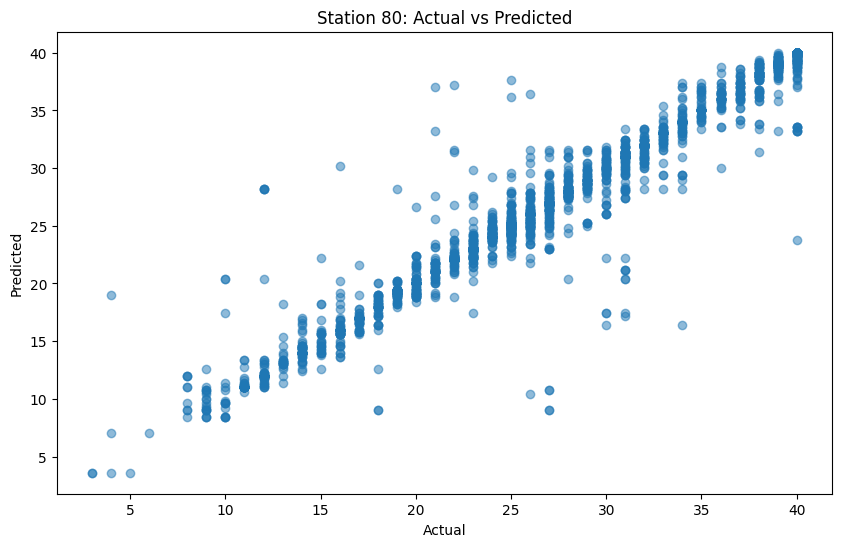

--------------------------------------------------
Number of predictions for station 82: 2502
R^2 Score: 0.9840974400675918
Accuracy: 0.7182254196642686


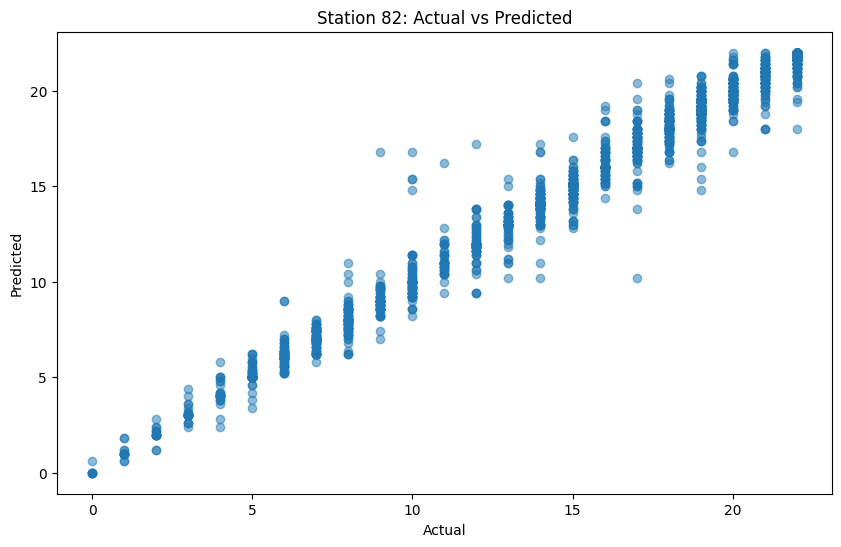

--------------------------------------------------
Number of predictions for station 83: 2716
R^2 Score: 0.9794034330792007
Accuracy: 0.5806332842415317


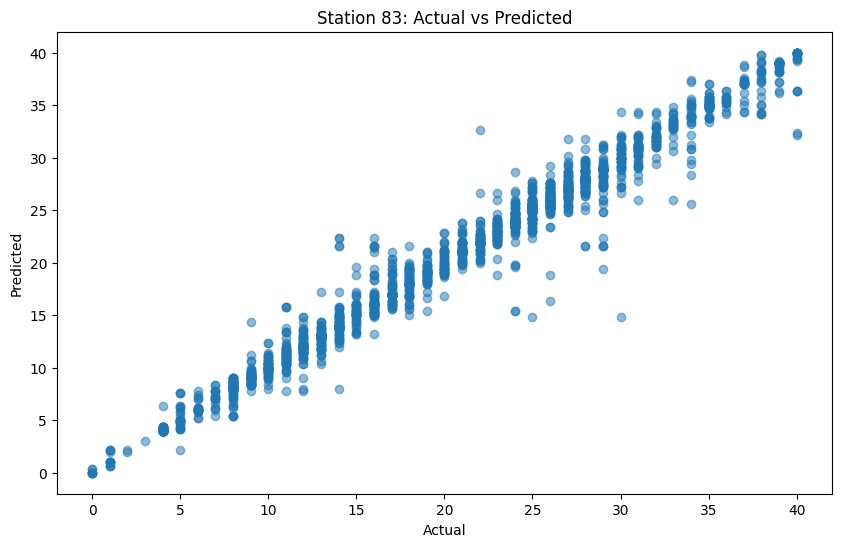

--------------------------------------------------
Number of predictions for station 84: 2595
R^2 Score: 0.9809447274087278
Accuracy: 0.6732177263969171


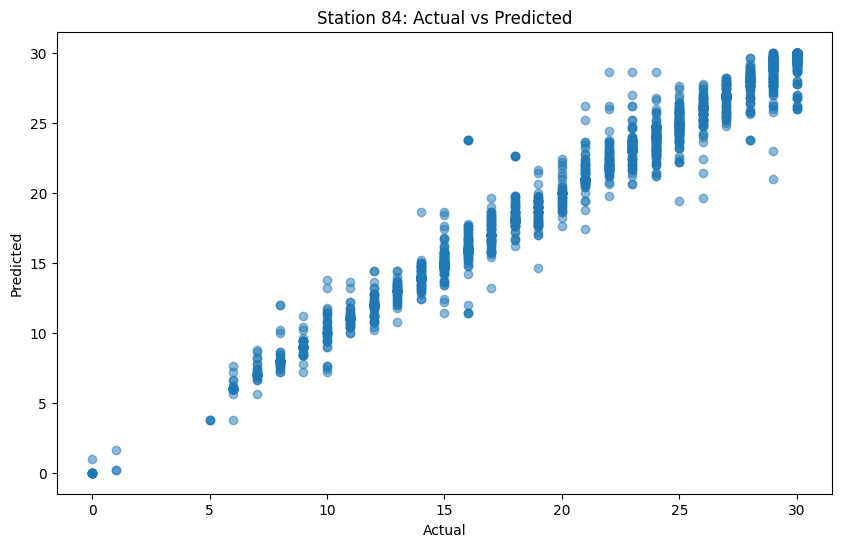

--------------------------------------------------
Number of predictions for station 85: 2649
R^2 Score: 0.968449129764116
Accuracy: 0.6055115137787844


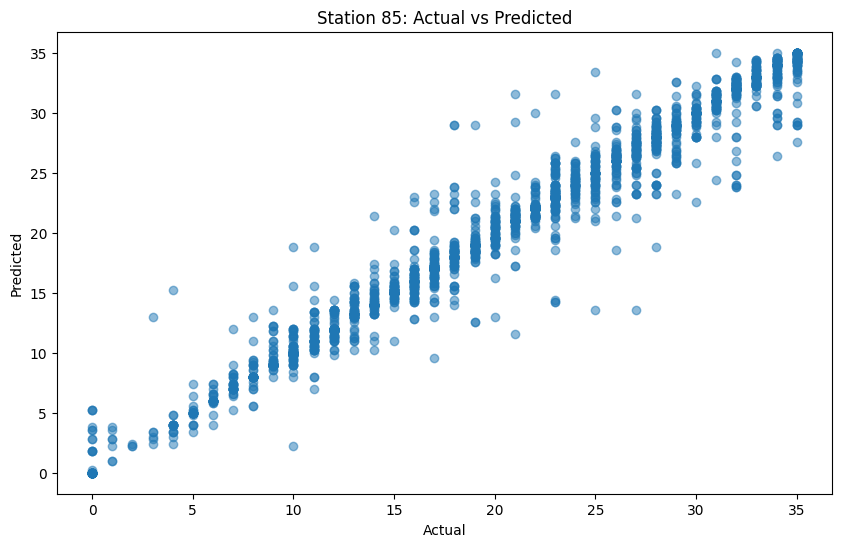

--------------------------------------------------
Number of predictions for station 86: 2842
R^2 Score: 0.975041837721112
Accuracy: 0.5263898662913441


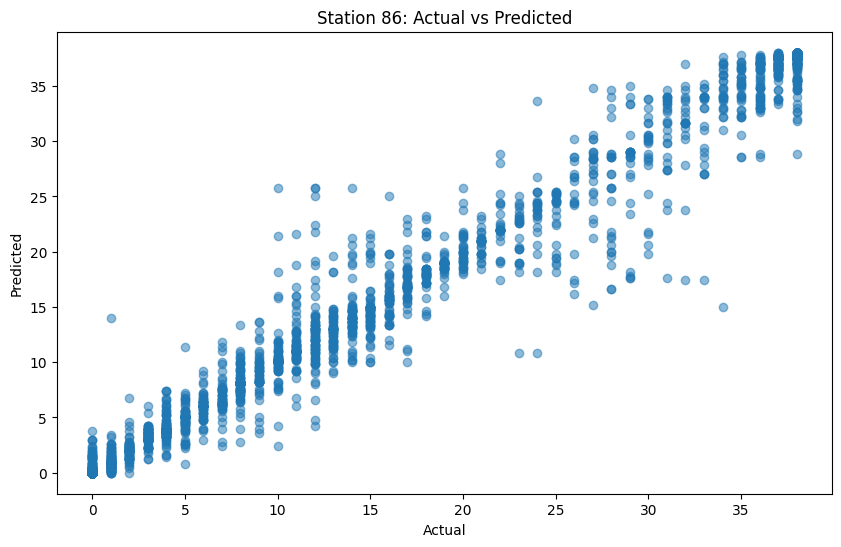

--------------------------------------------------
Number of predictions for station 87: 2674
R^2 Score: 0.986356562045867
Accuracy: 0.5897531787584144


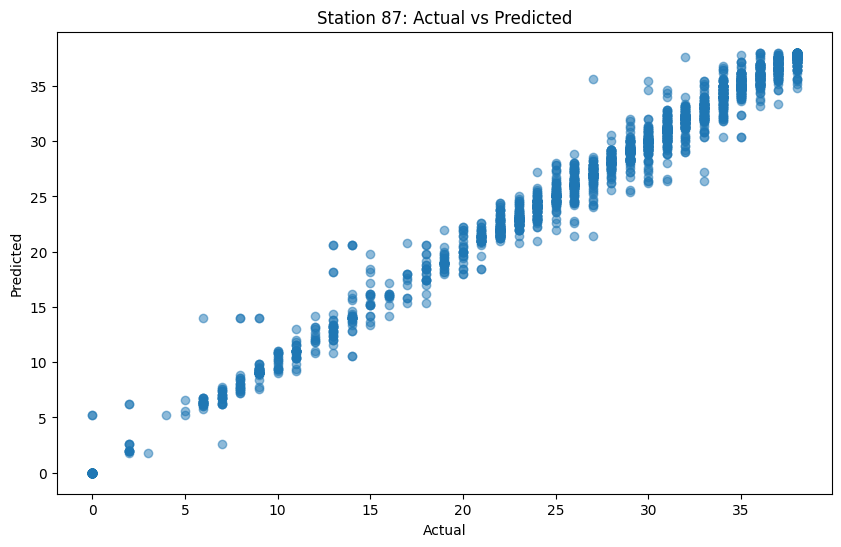

--------------------------------------------------
Number of predictions for station 88: 2731
R^2 Score: 0.9698253968614828
Accuracy: 0.5316733797143903


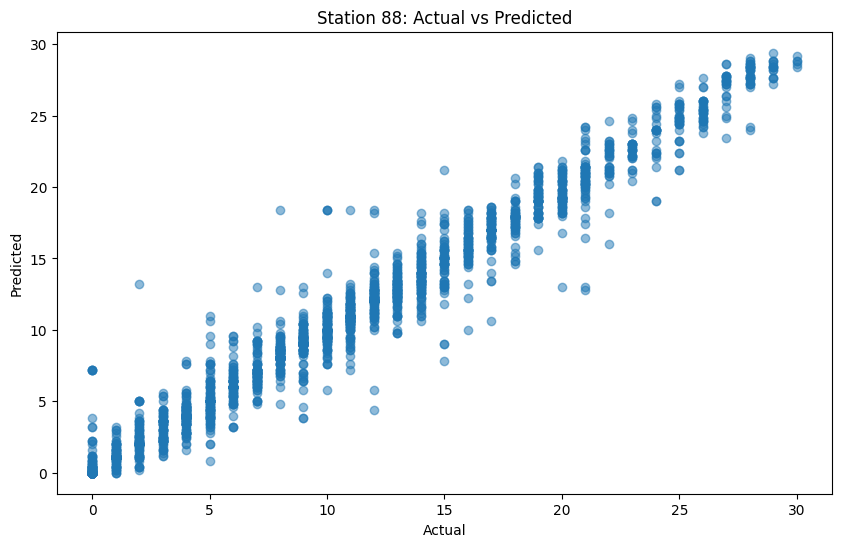

--------------------------------------------------
Number of predictions for station 89: 2537
R^2 Score: 0.9635602943132398
Accuracy: 0.7280252266456445


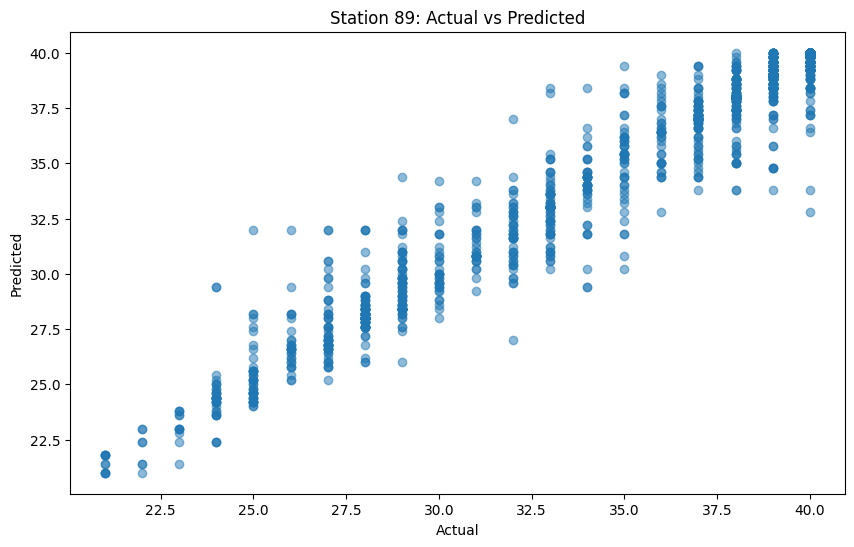

--------------------------------------------------
Number of predictions for station 90: 2922
R^2 Score: 0.9628551665240552
Accuracy: 0.5051334702258727


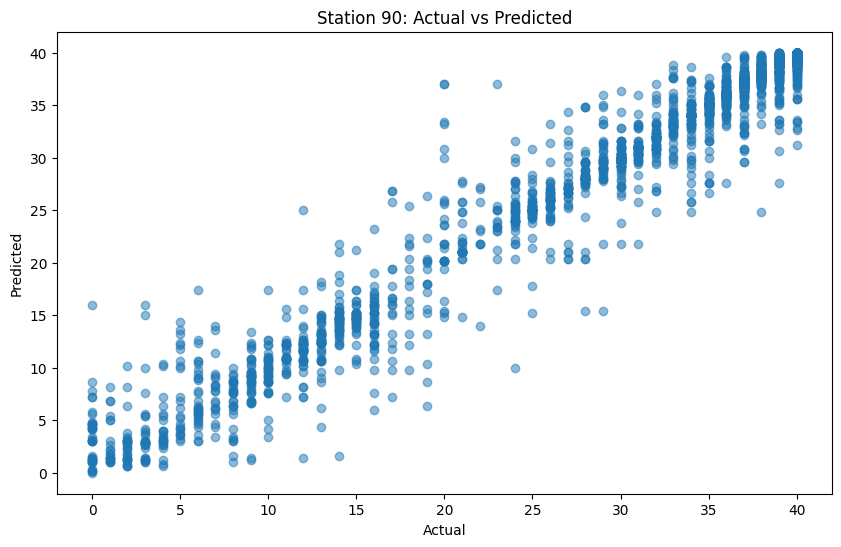

--------------------------------------------------
Number of predictions for station 91: 3037
R^2 Score: 0.947133987462024
Accuracy: 0.44056634837010206


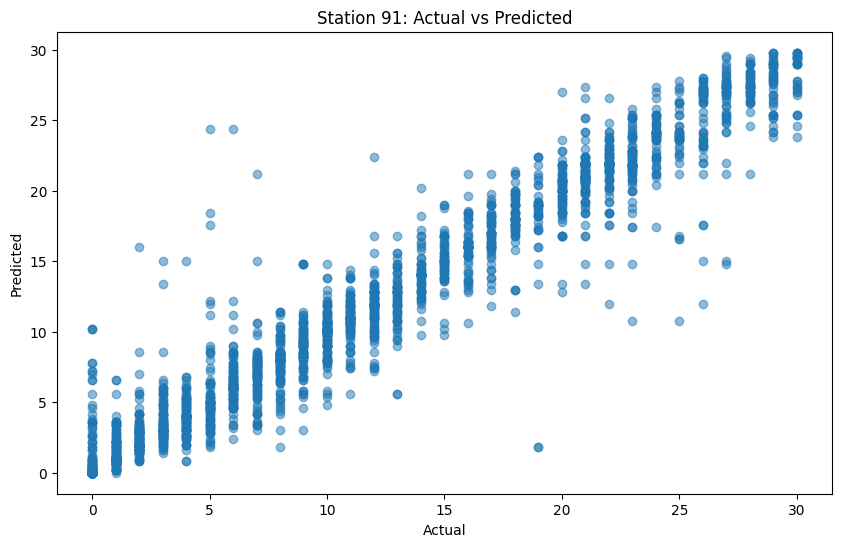

--------------------------------------------------
Number of predictions for station 92: 2762
R^2 Score: 0.9731803134860362
Accuracy: 0.5952208544532948


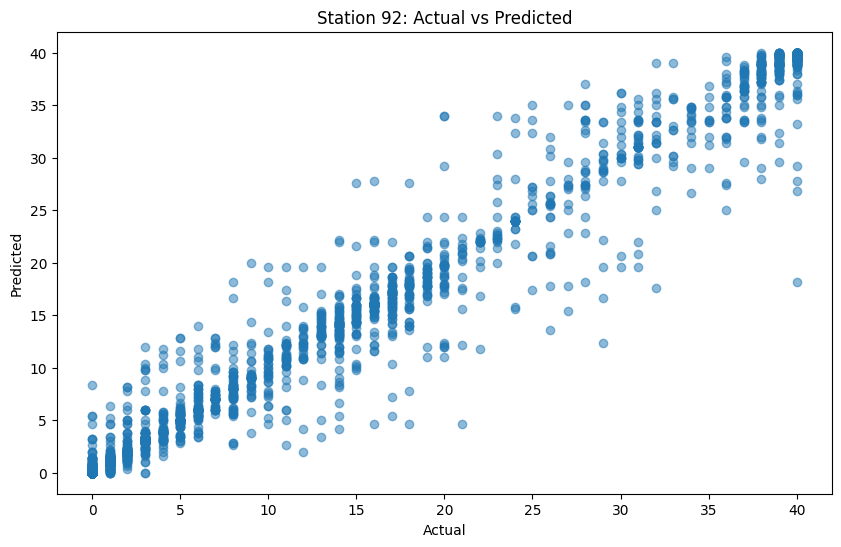

--------------------------------------------------
Number of predictions for station 93: 2557
R^2 Score: 0.9651847754095674
Accuracy: 0.8021118498240125


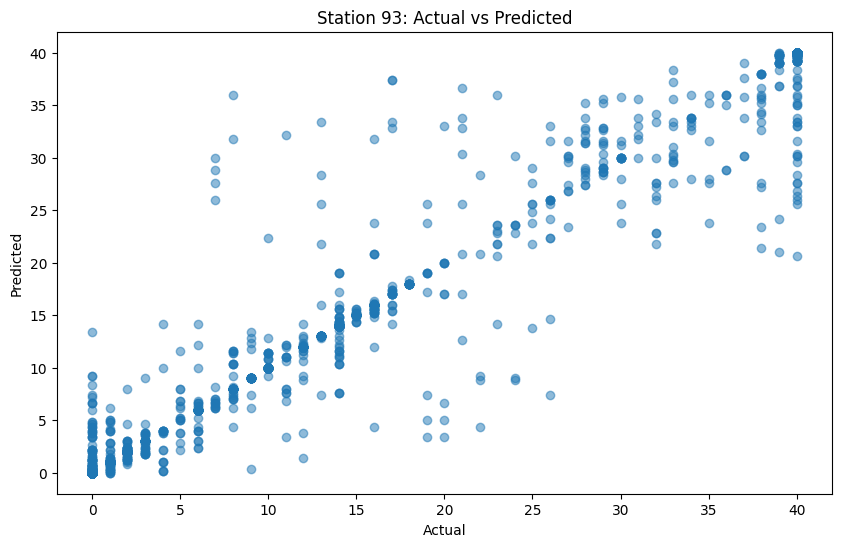

--------------------------------------------------
Number of predictions for station 94: 2530
R^2 Score: 0.983394260614061
Accuracy: 0.8312252964426877


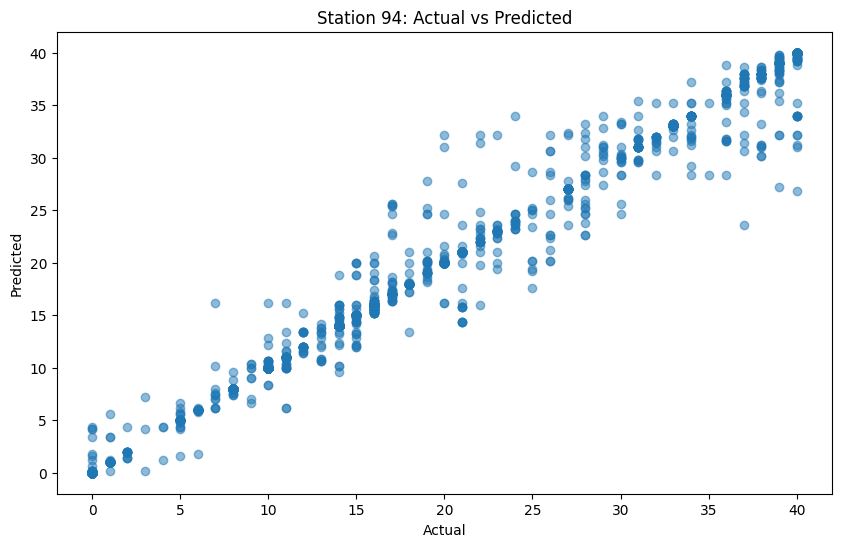

--------------------------------------------------
Number of predictions for station 95: 2800
R^2 Score: 0.9800643905100457
Accuracy: 0.5357142857142857


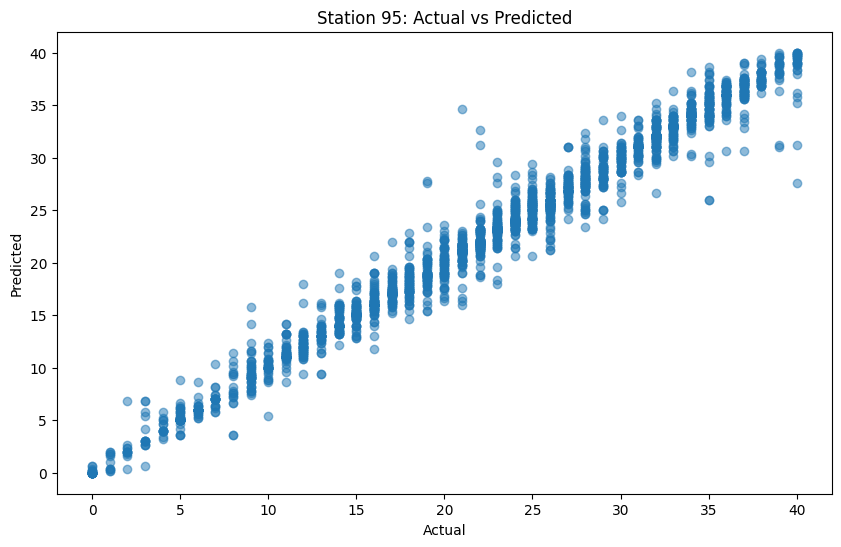

--------------------------------------------------
Number of predictions for station 96: 2429
R^2 Score: 0.9775627364136279
Accuracy: 0.7657472210786331


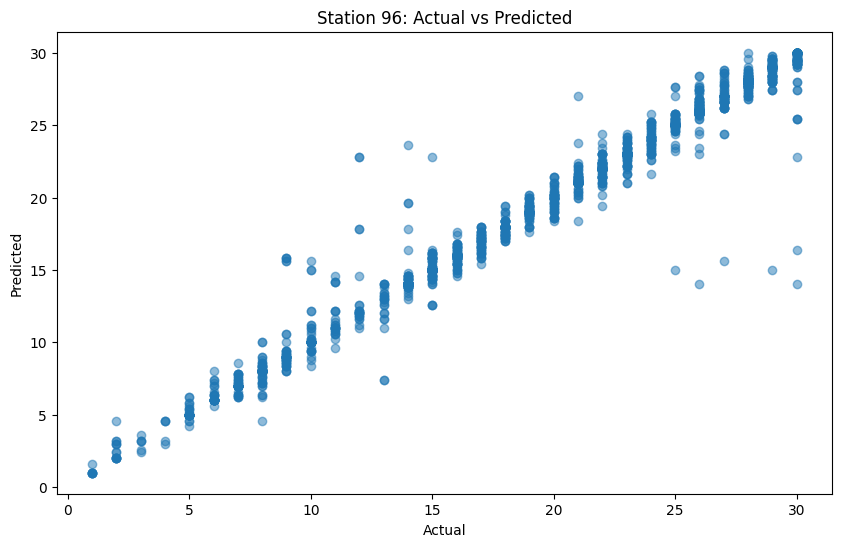

--------------------------------------------------
Number of predictions for station 97: 2728
R^2 Score: 0.9473156948992019
Accuracy: 0.532624633431085


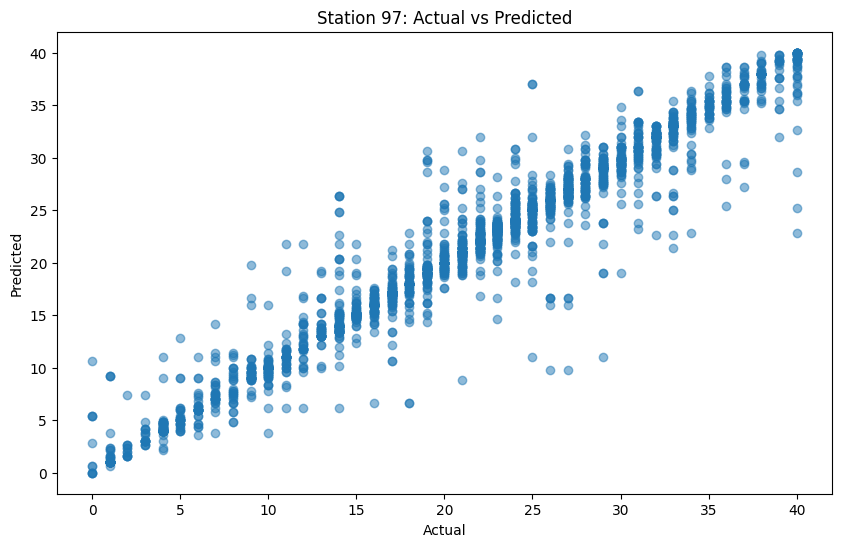

--------------------------------------------------
Number of predictions for station 98: 2665
R^2 Score: 0.9855603855164529
Accuracy: 0.6097560975609756


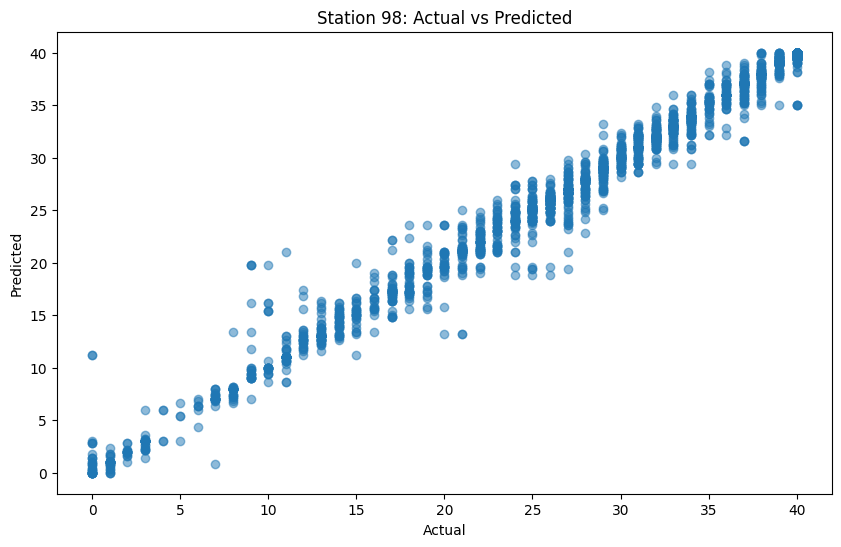

--------------------------------------------------
Number of predictions for station 99: 2671
R^2 Score: 0.9806685046446793
Accuracy: 0.623736428304006


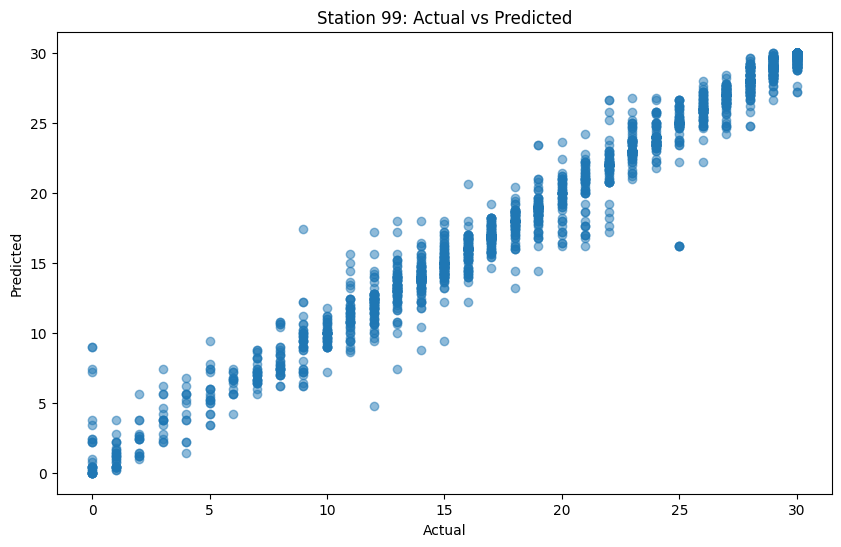

--------------------------------------------------
Number of predictions for station 100: 2808
R^2 Score: 0.9448829207495875
Accuracy: 0.5324074074074074


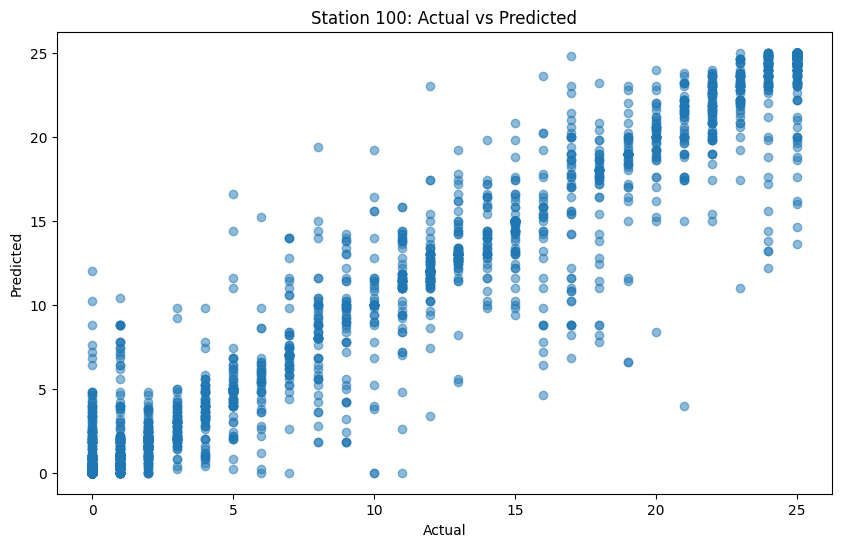

--------------------------------------------------
Number of predictions for station 101: 2728
R^2 Score: 0.9746161839243366
Accuracy: 0.5201612903225806


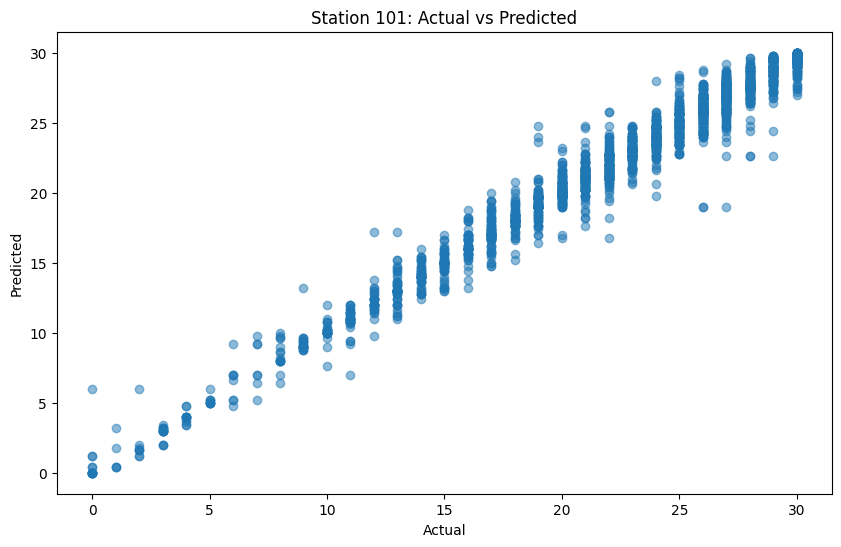

--------------------------------------------------
Number of predictions for station 102: 2580
R^2 Score: 0.9484729082950287
Accuracy: 0.6344961240310077


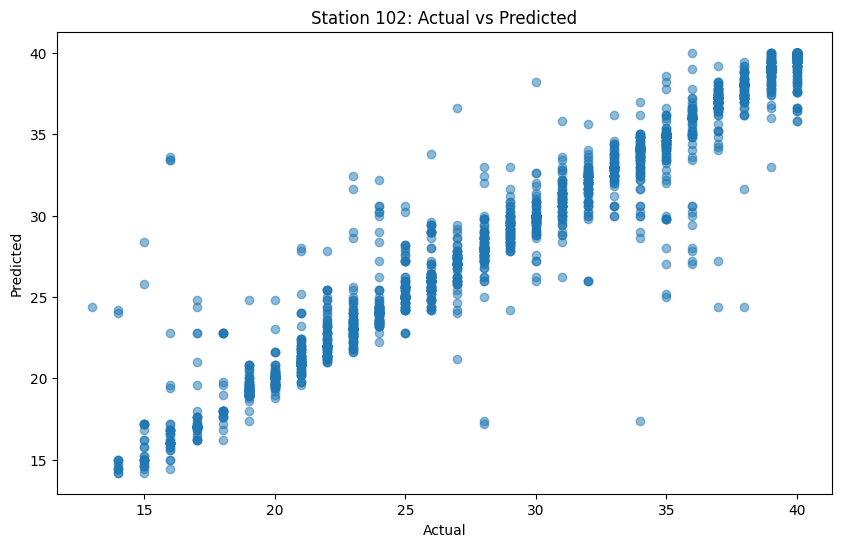

--------------------------------------------------
Number of predictions for station 103: 2578
R^2 Score: 0.952214888247808
Accuracy: 0.6772692009309542


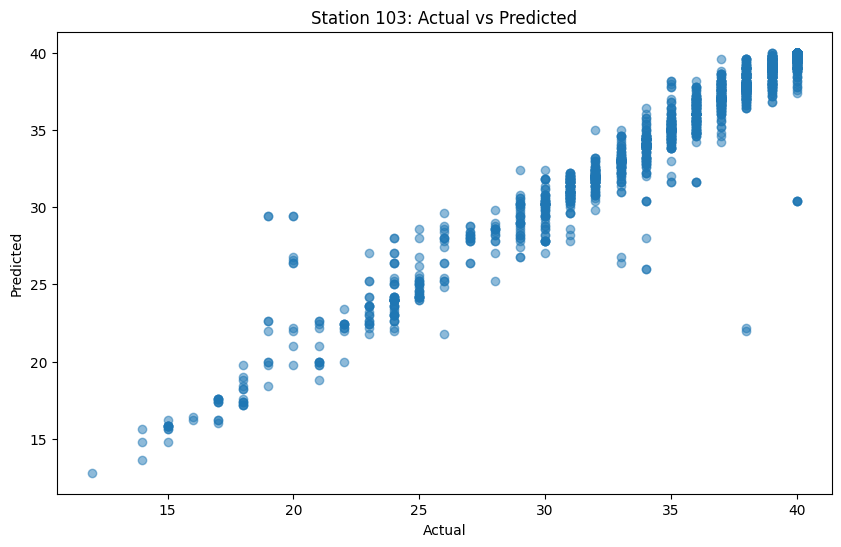

--------------------------------------------------
Number of predictions for station 104: 2454
R^2 Score: 0.975627010550863
Accuracy: 0.8524857375713122


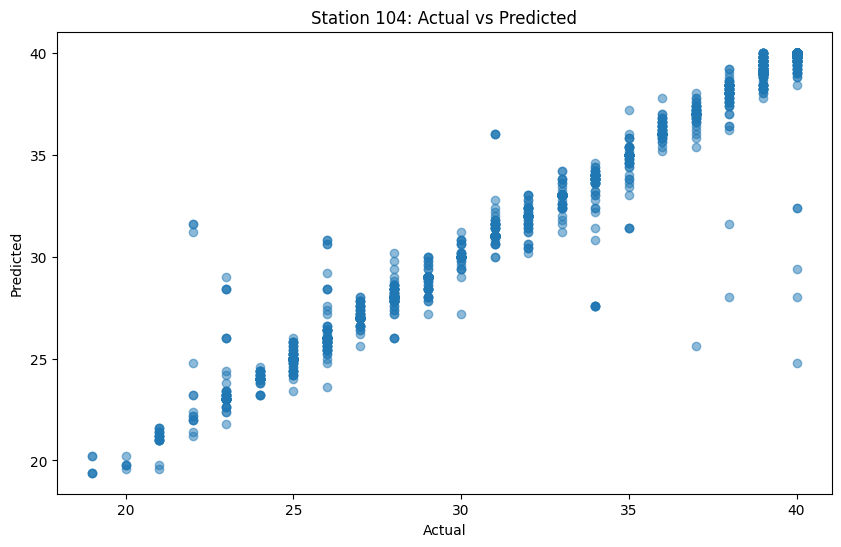

--------------------------------------------------
Number of predictions for station 105: 2517
R^2 Score: 0.9677185290229824
Accuracy: 0.7580452920143027


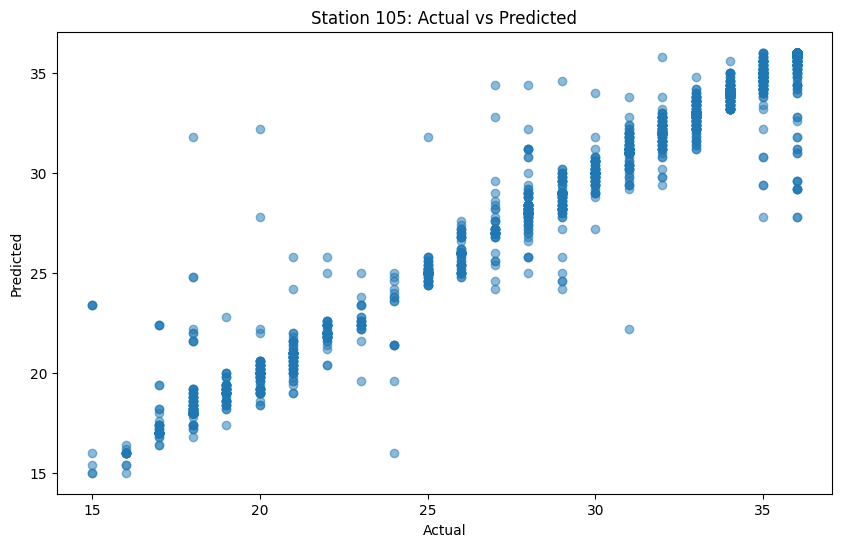

--------------------------------------------------
Number of predictions for station 106: 2568
R^2 Score: 0.9237915259630565
Accuracy: 0.6281152647975078


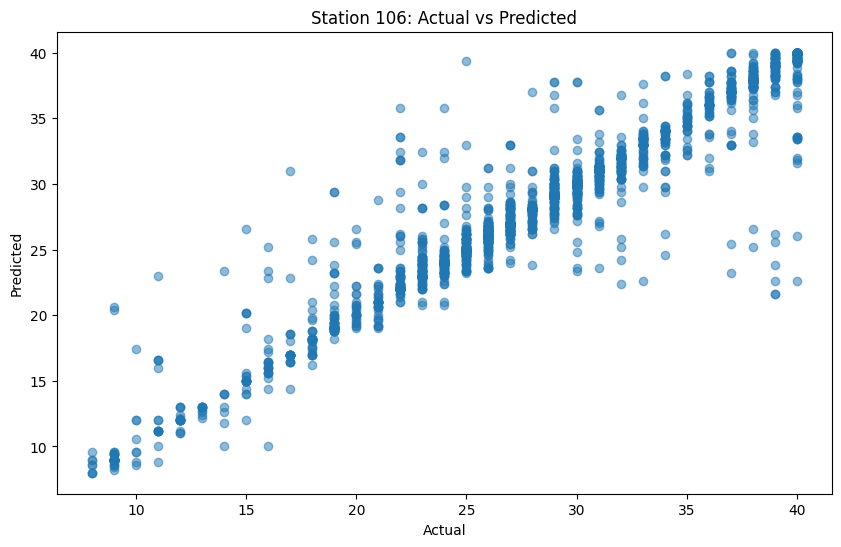

--------------------------------------------------
Number of predictions for station 107: 2653
R^2 Score: 0.9529171536003349
Accuracy: 0.5880135695439126


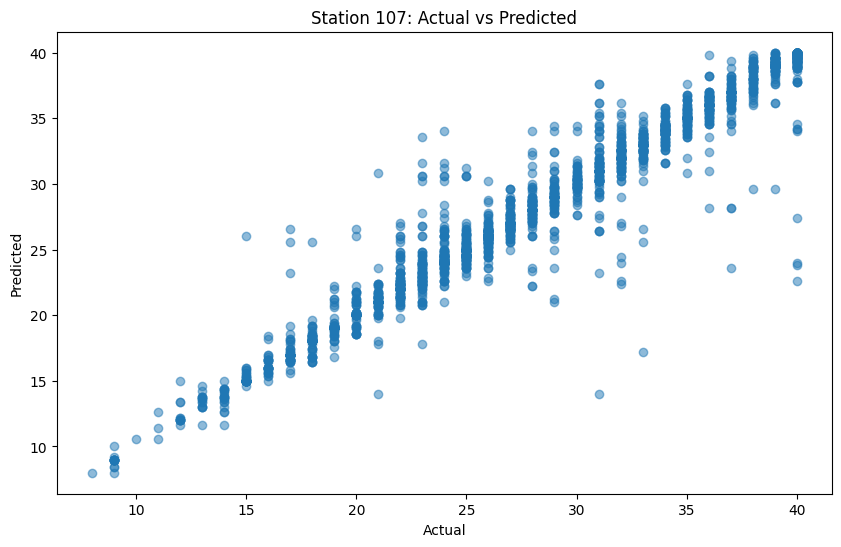

--------------------------------------------------
Number of predictions for station 108: 2665
R^2 Score: 0.9509741079019165
Accuracy: 0.6


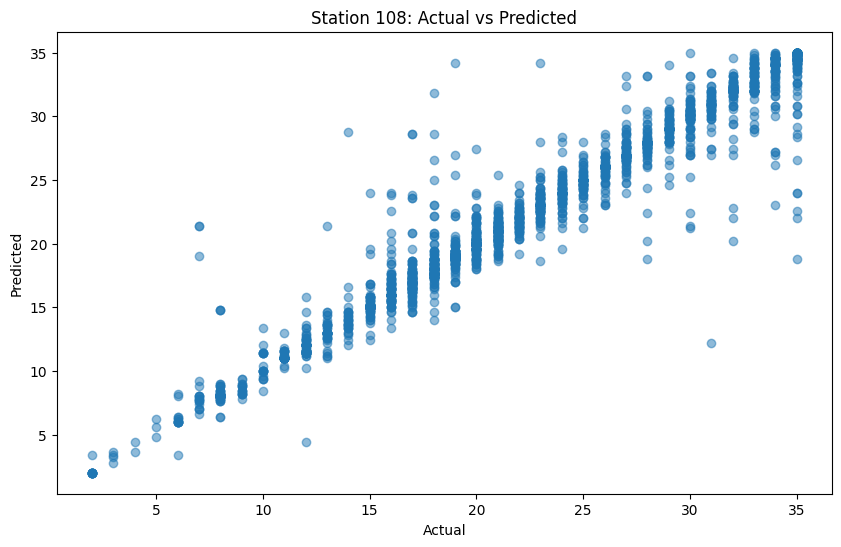

--------------------------------------------------
Number of predictions for station 109: 2743
R^2 Score: 0.977230413214224
Accuracy: 0.5632519139628145


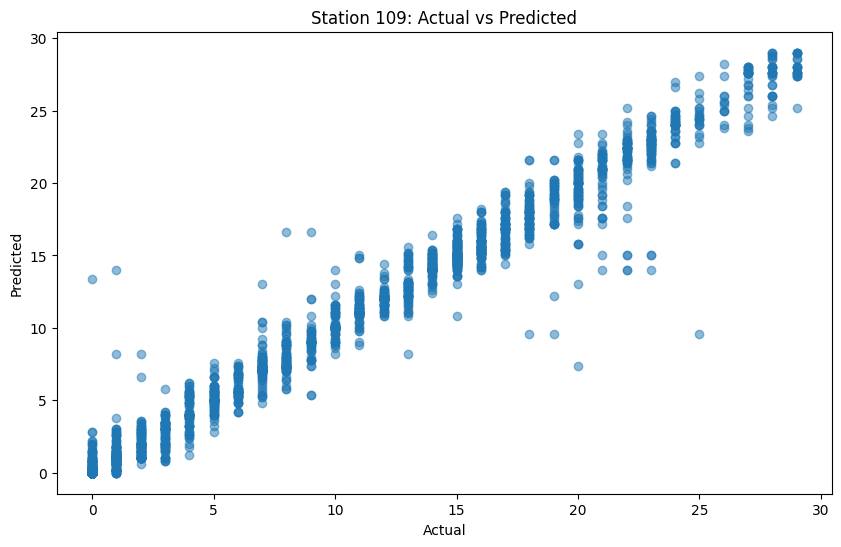

--------------------------------------------------
Number of predictions for station 110: 2622
R^2 Score: 0.9726502220862231
Accuracy: 0.6270022883295194


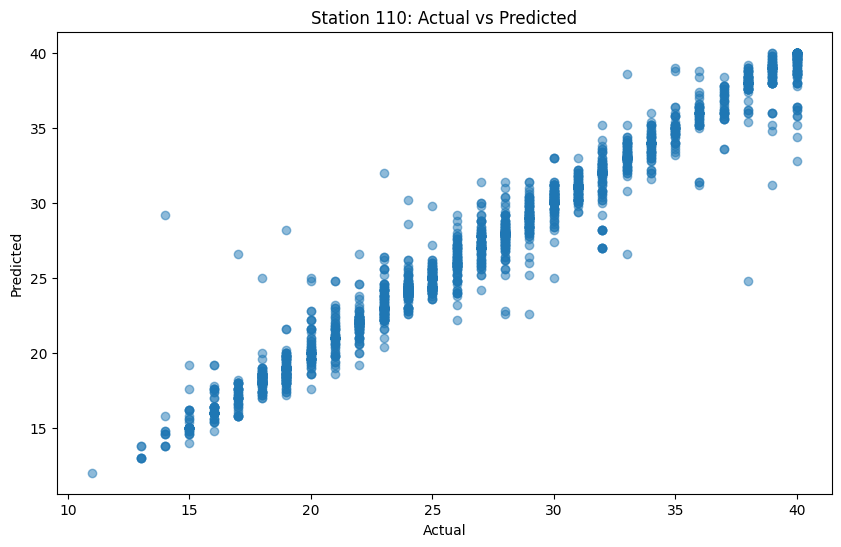

--------------------------------------------------
Number of predictions for station 111: 2702
R^2 Score: 0.9620343230853834
Accuracy: 0.5544041450777202


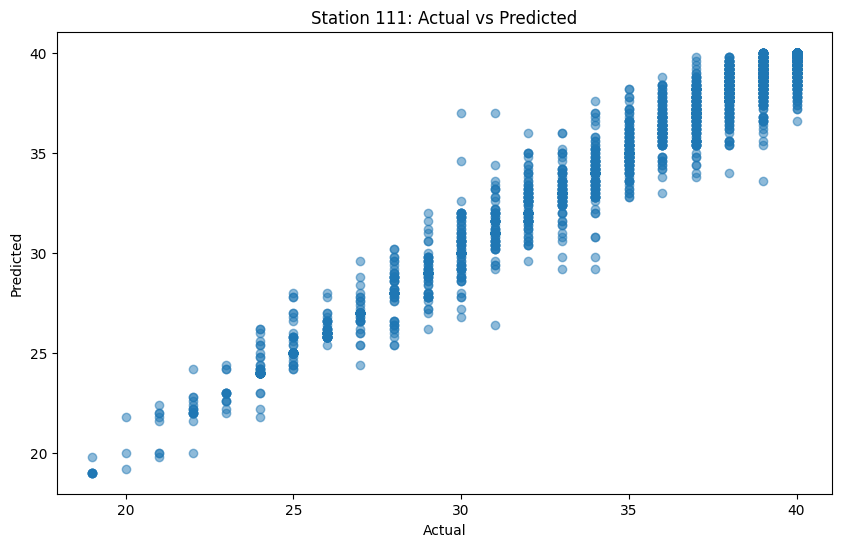

--------------------------------------------------
Number of predictions for station 112: 2930
R^2 Score: 0.9662341826759653
Accuracy: 0.42696245733788396


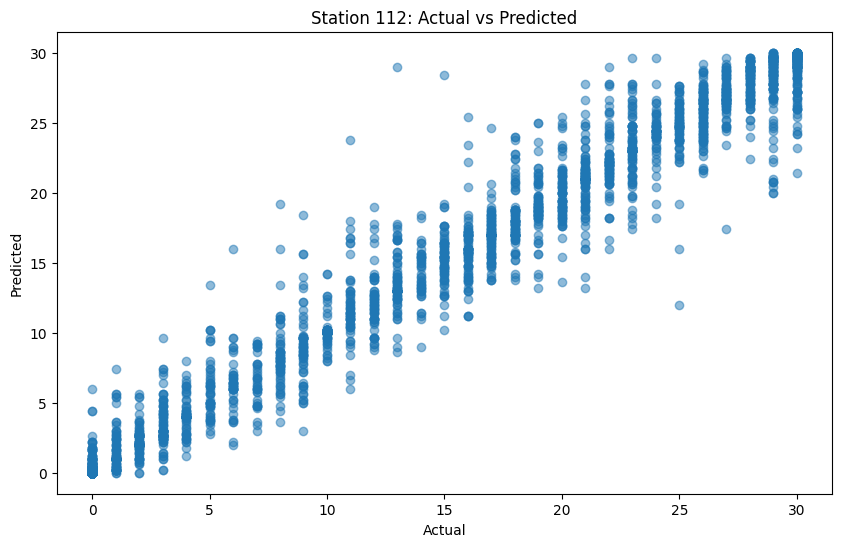

--------------------------------------------------
Number of predictions for station 113: 2488
R^2 Score: 0.9867250517059606
Accuracy: 0.7552250803858521


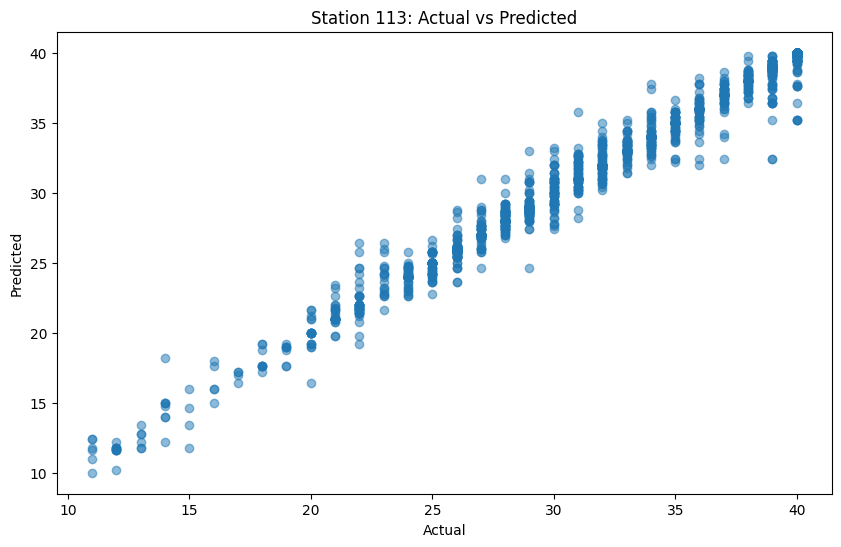

--------------------------------------------------
Number of predictions for station 114: 2854
R^2 Score: 0.9671181487437743
Accuracy: 0.49474421864050455


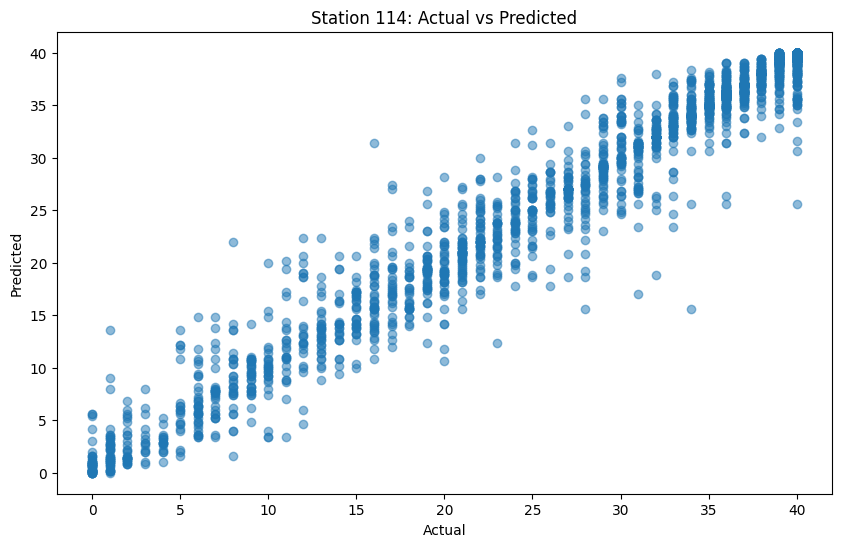

--------------------------------------------------
Number of predictions for station 115: 3001
R^2 Score: 0.9740259767929462
Accuracy: 0.5024991669443519


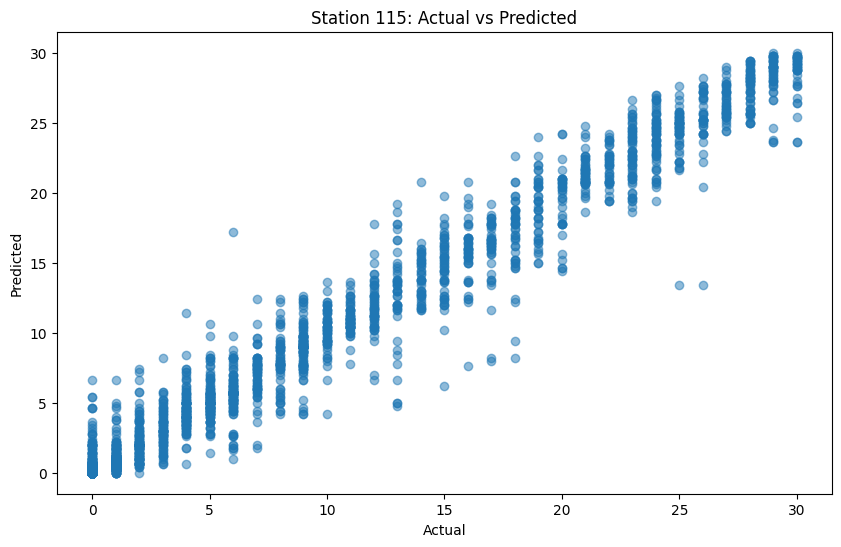

--------------------------------------------------
Number of predictions for station 116: 2444
R^2 Score: 0.9629293292223253
Accuracy: 0.7291325695581015


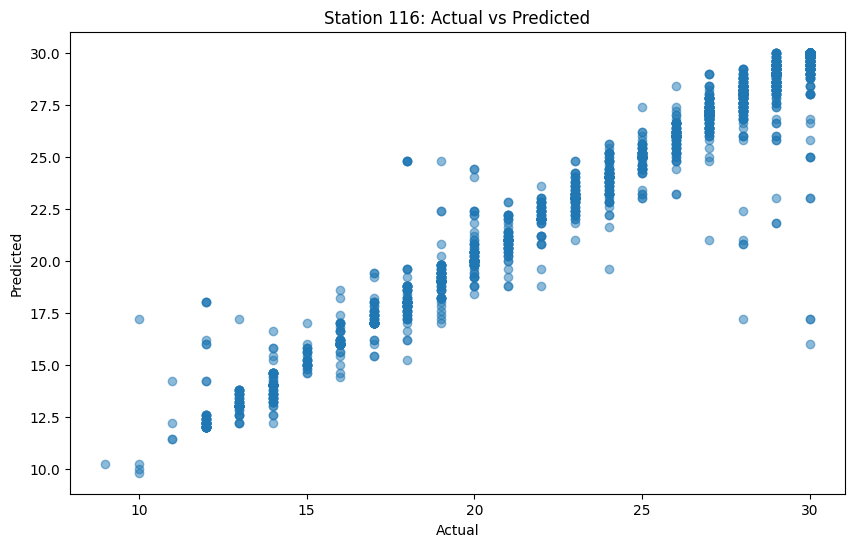

--------------------------------------------------
Number of predictions for station 117: 2574
R^2 Score: 0.9818911039442455
Accuracy: 0.6484071484071484


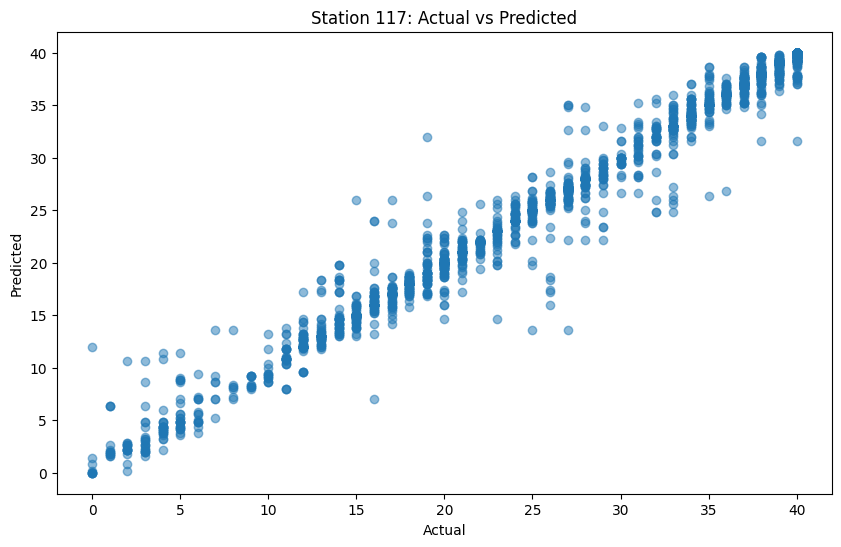

--------------------------------------------------


In [5]:
stations = df["number"].unique()

models = {}
if not os.path.exists("models_bike_stands"):
    os.makedirs("models_bike_stands")

for station in stations:
    df_station = df[df["number"] == station]

    X = df_station.drop(
        [
            "time",
            "date",
            "available_bikes",
            "number",
            "available_bike_stands",
            "lon",
            "lat",
            "id",
            "weather_description",
            "curr_time",
            "last_update",
        ],
        axis=1,
    )
    y = df_station["available_bike_stands"]

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42
    )

    # Train a KNN model
    model = KNeighborsRegressor()
    model.fit(X_train, y_train)

    # Store the model in the dictionary
    models[station] = model

    # Serialize model
    dump(model, f"models_bike_stands/model_bike_stand{station}.joblib")

    # Make predictions on the testing data
    y_pred = model.predict(X_test)
    print(f"Number of predictions for station {station}: {len(y_pred)}")

    # Evaluate the model
    r2_score = model.score(X_test, y_test)
    print(f"R^2 Score: {r2_score}")
    y_pred_rounded = np.round(y_pred)

    accuracy = accuracy_score(y_test, y_pred_rounded)
    print(f"Accuracy: {accuracy}")

    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, y_pred, alpha=0.5)
    plt.xlabel("Actual")
    plt.ylabel("Predicted")
    plt.title(f"Station {station}: Actual vs Predicted")
    plt.show()
    print("--------------------------------------------------")